In [1]:
pip install clustimage


[notice] A new release of pip available: 22.3.1 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


[clustimage] >INFO> Import dataset [flowers]
[clustimage] >INFO> Extracting files..
[clustimage] >INFO> [214] files are collected recursively from path: [/home/lkarimi/myvenv/lib/python3.11/site-packages/datazets/data/flower_images]


[55 76 53 ... 44 74 48]
49152


(-0.5, 127.5, 127.5, -0.5)

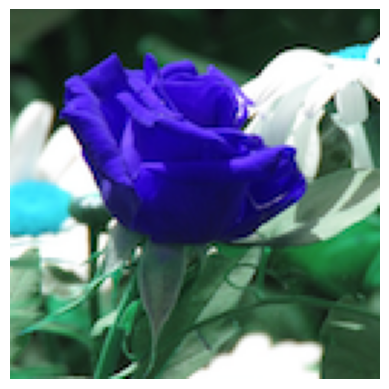

In [2]:
# Import libraries
from clustimage import Clustimage
import matplotlib.pyplot as plt

# Initialize
cl = Clustimage()

# Load example dataset
pathnames = cl.import_example(data='flowers')

# Preprocessing of the first image
# 0: cv2.IMREAD_GRAYSCALE
# 1: cv2.IMREAD_COLOR
img = cl.imread(pathnames[0], dim=(128,128), colorscale=1, flatten=True)

# Flattened array
print(img)
# array([ 10,  22,  13, ...,  78,  74, 117], dtype=uint8)

# Length of the vector is Height x Width x #Channels (RGB) = 128*128*3
print(len(img))
# 49152

# Plot. Note that reshape is only required in case flatten=True
plt.figure()
plt.imshow(img.reshape(128,128,3))
plt.axis('off')

Image shape: (128, 128, 4)


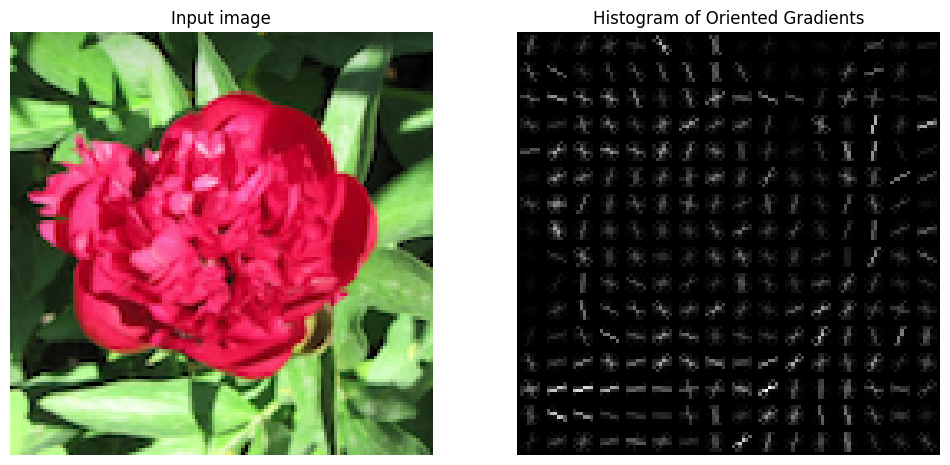

In [3]:
from skimage.feature import hog
from skimage import io
import matplotlib.pyplot as plt

# Load image directly using skimage.io (assuming pathnames[10] is your image file path)
img = io.imread(pathnames[10])

# Check the image shape
print("Image shape:", img.shape)

# Extract HOG features
fd, hog_image = hog(img, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=8, visualize=True, channel_axis=-1)

# Plotting the results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(img, cmap=plt.cm.gray)
ax1.set_title('Input image')

# Rescale histogram for better display
hog_image_rescaled = (hog_image - hog_image.min()) / (hog_image.max() - hog_image.min())

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
plt.show()


In [17]:
# Import library
from clustimage import Clustimage

# init with PCA method
# cl = Clustimage(method='pca')
cl = Clustimage(method='pca',
                embedding='tsne',
                grayscale=False,
                dim=(128,128),
                params_pca={'n_components':0.95})

# Load MNIST example data
X, y = cl.import_example(data='mnist')

# There are 1797 digits in total, each with 64 features which is the flattened 8x8 grayscale image.
print(X.shape)
# (1797, 64)

print(X)
# # array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
# #        [ 0.,  0.,  0., ..., 10.,  0.,  0.],
# #        [ 0.,  0.,  0., ..., 16.,  9.,  0.],
# #        ...,
# #        [ 0.,  0.,  1., ...,  6.,  0.,  0.],
# #        [ 0.,  0.,  2., ..., 12.,  0.,  0.],
# #        [ 0.,  0., 10., ..., 12.,  1.,  0.]])

# # Preprocessing, feature extraction, embedding and cluster evaluation
# # results = cl.fit_transform(X)
results = cl.fit_transform(X,
                           cluster='agglomerative',
                           evaluate='silhouette',
                           metric='euclidean',
                           linkage='ward',
                           min_clust=3,
                           max_clust=25,
                           cluster_space='high')



[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> Import dataset [mnist]
[clustimage] >INFO> Cleaning previous fitted model results
[clustimage] >INFO> Reading and checking images.
[clustimage] >INFO> Scaling images..
[clustimage] >INFO> Writing images to tempdir [/tmp/clustimage]


(1797, 64)
[[ 0.  0.  5. ...  0.  0.  0.]
 [ 0.  0.  0. ... 10.  0.  0.]
 [ 0.  0.  0. ... 16.  9.  0.]
 ...
 [ 0.  0.  1. ...  6.  0.  0.]
 [ 0.  0.  2. ... 12.  0.  0.]
 [ 0.  0. 10. ... 12.  1.  0.]]


[clustimage]: 100%|██████████| 1797/1797 [00:00<00:00, 14423.51it/s]
[clustimage] >INFO> Extracting features using method: [pca]
[clustimage] >INFO> Extracted features using [pca]: samples=1797, features=29
[clustimage] >INFO> Compute [tsne] embedding
[clustimage] >INFO> Cluster evaluation using the [high] feature space of the [pca] features.
[clustimage] >INFO> Saving data in memory.
[clustimage] >INFO> Fit with method=[agglomerative], metric=[euclidean], linkage=[ward]
[clustimage] >INFO> Evaluate using silhouette.
[clusteval] >INFO: 100%|██████████| 22/22 [00:00<00:00, 28.46it/s]
[clustimage] >INFO> Compute dendrogram threshold.
[clustimage] >INFO> Optimal number clusters detected: [10].
[clustimage] >INFO> Fin.
[clustimage] >INFO> Updating cluster-labels and cluster-model based on the (1797, 29) feature-space.


In [18]:
# Import library
from clustimage import Clustimage

# Initialize Clustimage with PCA method
cl = Clustimage(method='pca')

# Load MNIST example data
Xraw, yraw = cl.import_example(data='mnist')  # Unpacking the data and labels

# Use only the image data for processing
X = cl.import_data(Xraw)

# Extract features with the initialized method (PCA in this case)
Xfeat = cl.extract_feat(X)

# Embedding using tSNE
xycoord = cl.embedding(Xfeat)

# Cluster with all default settings
labels = cl.cluster(cluster='agglomerative',
                    evaluate='silhouette',
                    metric='euclidean',
                    linkage='ward',
                    min_clust=3,
                    max_clust=25,
                    cluster_space='high')

# Return results
results = cl.results


[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> Import dataset [mnist]
[clustimage] >INFO> Reading and checking images.
[clustimage] >INFO> Scaling images..
[clustimage] >INFO> Writing images to tempdir [/tmp/clustimage]
[clustimage]: 100%|██████████| 1797/1797 [00:00<00:00, 14330.84it/s]
[clustimage] >INFO> Extracting features using method: [pca]
[clustimage] >INFO> Extracted features using [pca]: samples=1797, features=29
[clustimage] >INFO> Compute [tsne] embedding
[clustimage] >INFO> Cluster evaluation using the [high] feature space of the [pca] features.
[clustimage] >INFO> Saving data in memory.
[clustimage] >INFO> Fit with method=[agglomerative], metric=[euclidean], linkage=[ward]
[clustimage] >INFO> Evaluate using silhouette.
[clusteval] >INFO: 100%|██████████| 22/22 [00:00<00:00, 28.34it/s]
[clustimage] >INFO> Compute dendrogram thresho

In [19]:
cl.results.keys()

dict_keys(['img', 'feat', 'xycoord', 'pathnames', 'labels', 'url', 'filenames'])

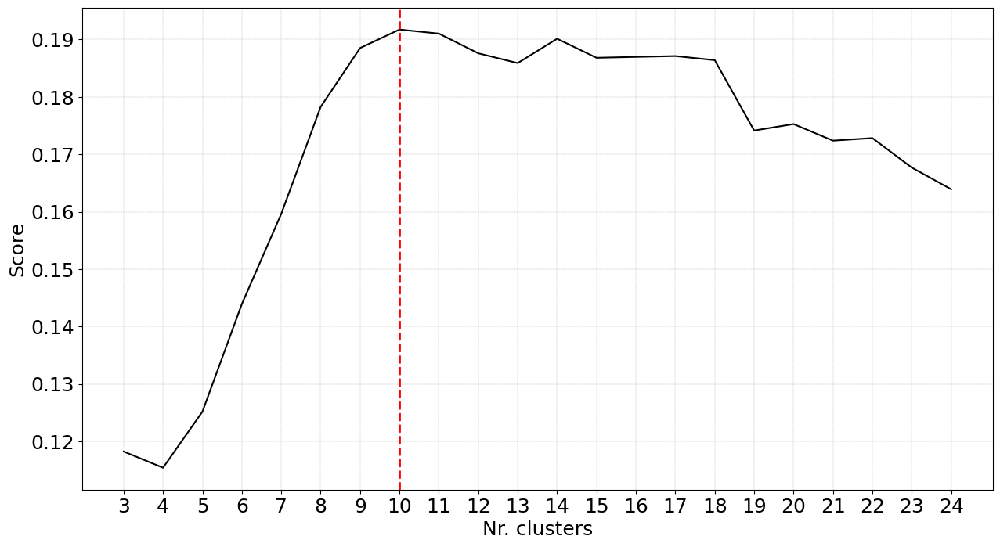

[clustimage] >INFO> Coordinates (x, y) are set based on the first two features.
[clustimage] >INFO> Set alpha based on density because of the parameter: [opaque]
[clustimage] >INFO> Create scatterplot
[clustimage] >INFO> Retrieving input data set.
[clustimage] >INFO> Plotting the dendrogram with optimized settings: metric=euclidean, linkage=ward, max_d=4445.954. Be patient now..
[clustimage] >INFO> Compute cluster labels.
[clustimage] >INFO> Updating cluster-labels 


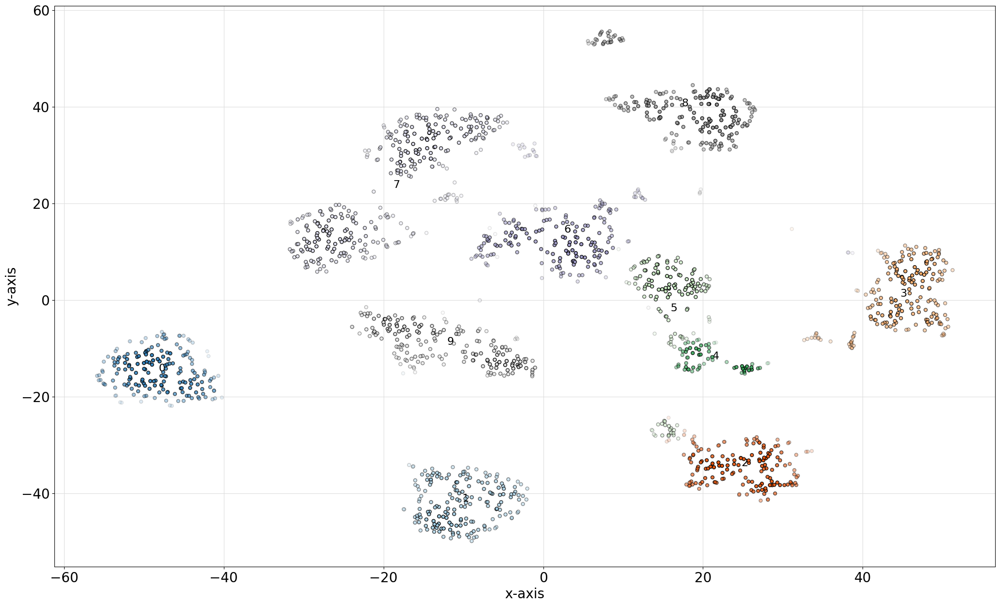

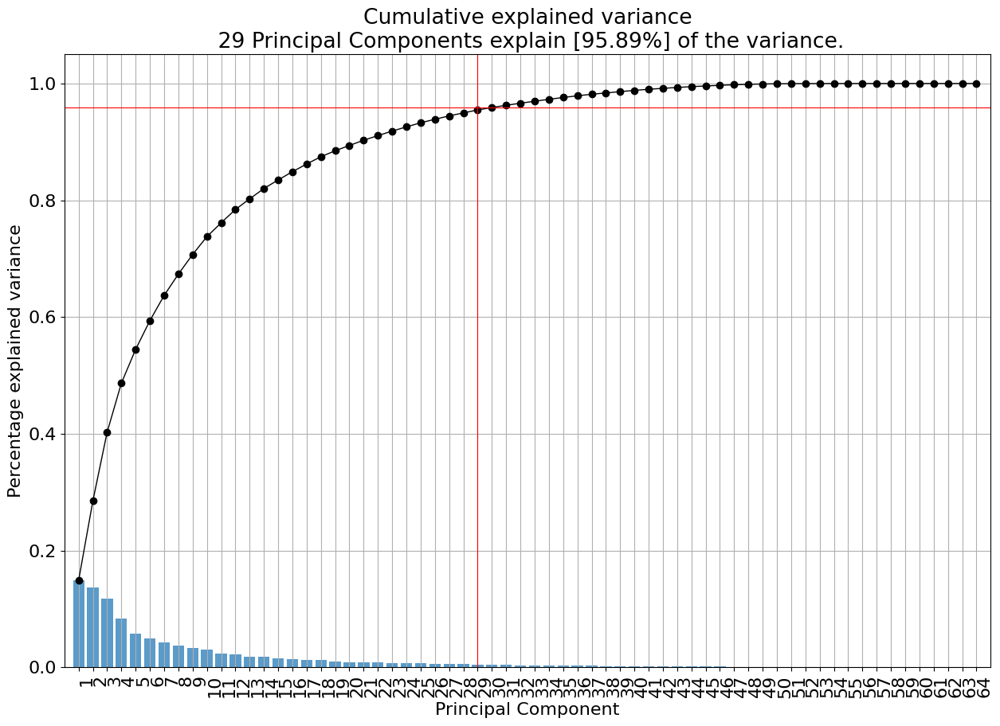

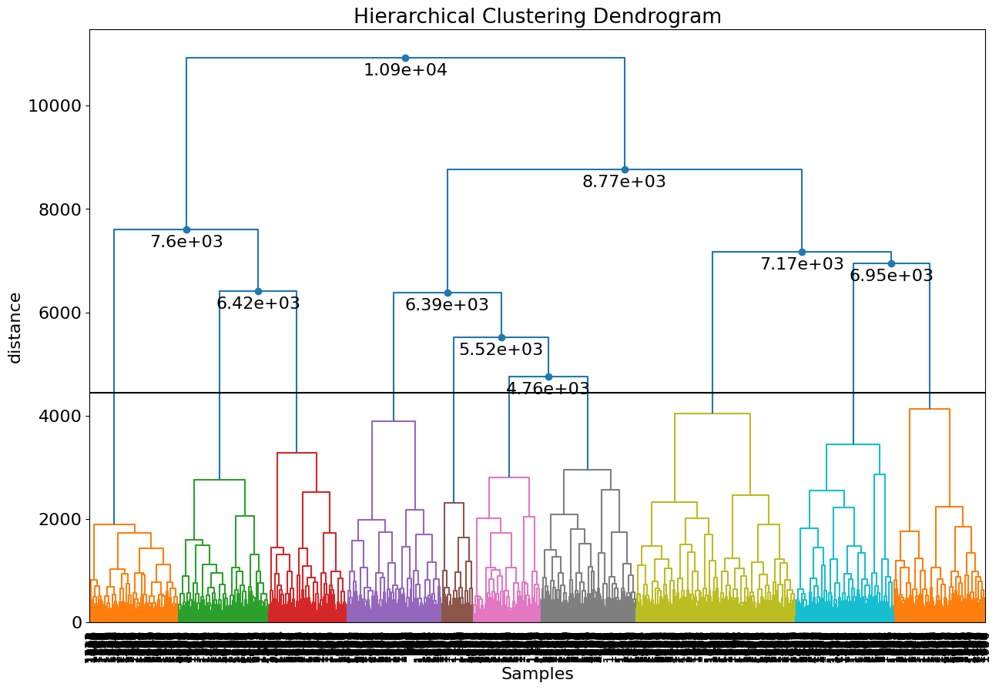

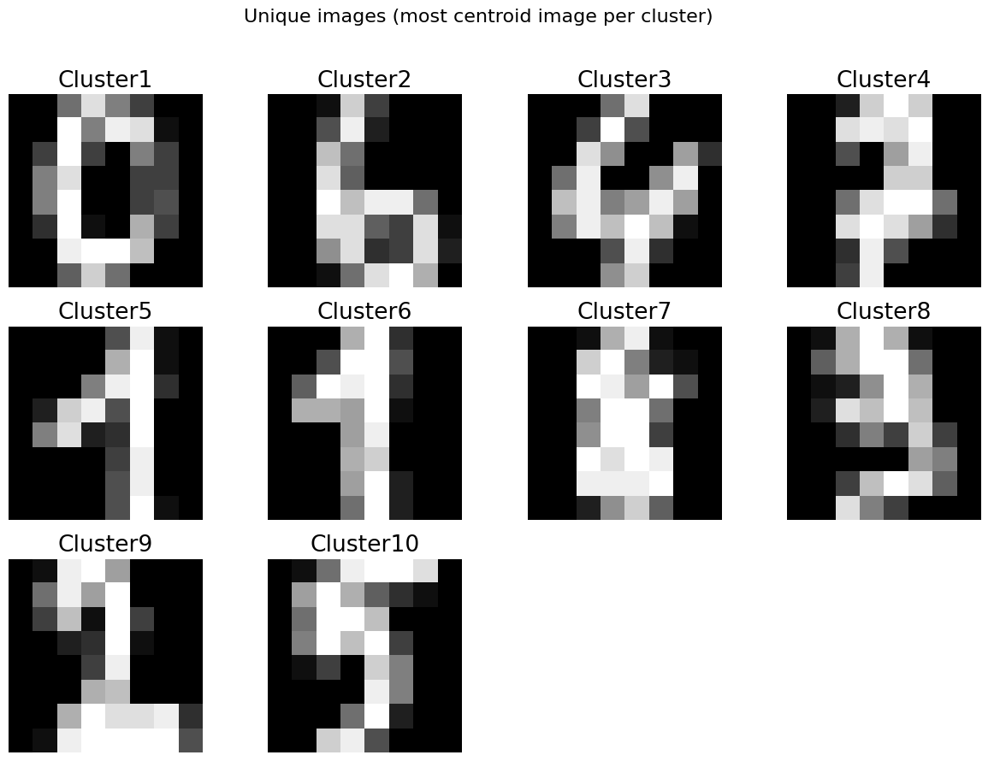

[clustimage] >WARNING> Colormap [Set1] can not create [10] unique colors! Available unique colors: [8].
[clustimage] >WARNING> Colormap [Set1] can not create [10] unique colors! Available unique colors: [8].
[clustimage] >INFO> Add transparency to RGB colors (last column)
[clustimage] >INFO> Add transparency to RGB colors (last column)
[clustimage] >INFO> Create scatterplot


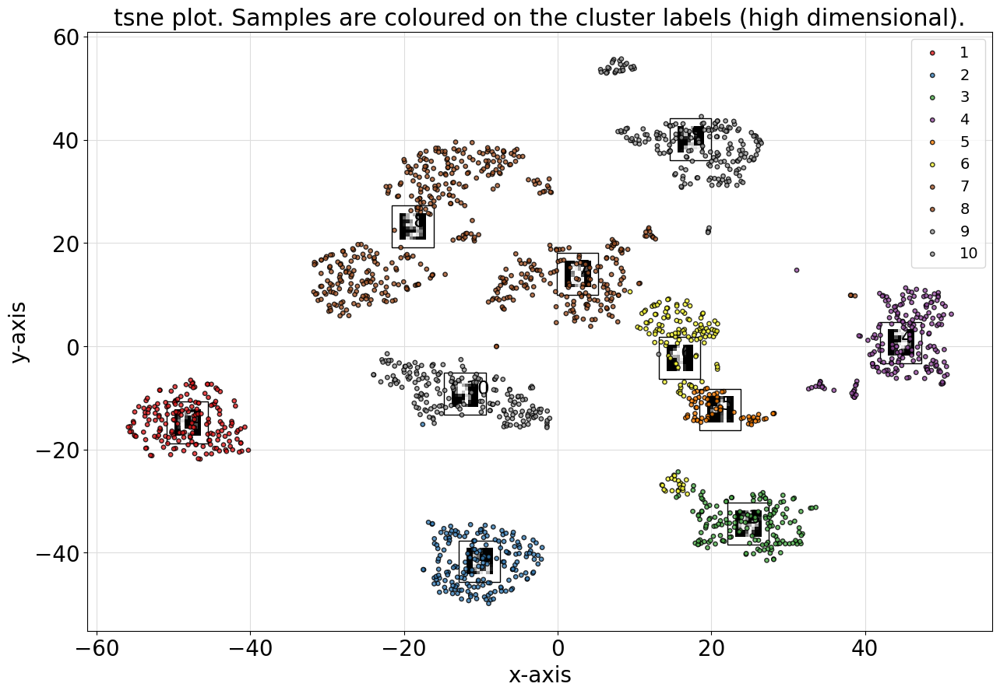

[clustimage] >WARNING> Colormap [Set1] can not create [10] unique colors! Available unique colors: [8].
[clustimage] >WARNING> Colormap [Set1] can not create [10] unique colors! Available unique colors: [8].
[clustimage] >INFO> Add transparency to RGB colors (last column)
[clustimage] >INFO> Add transparency to RGB colors (last column)
[clustimage] >INFO> Create scatterplot


<Figure size 640x480 with 0 Axes>

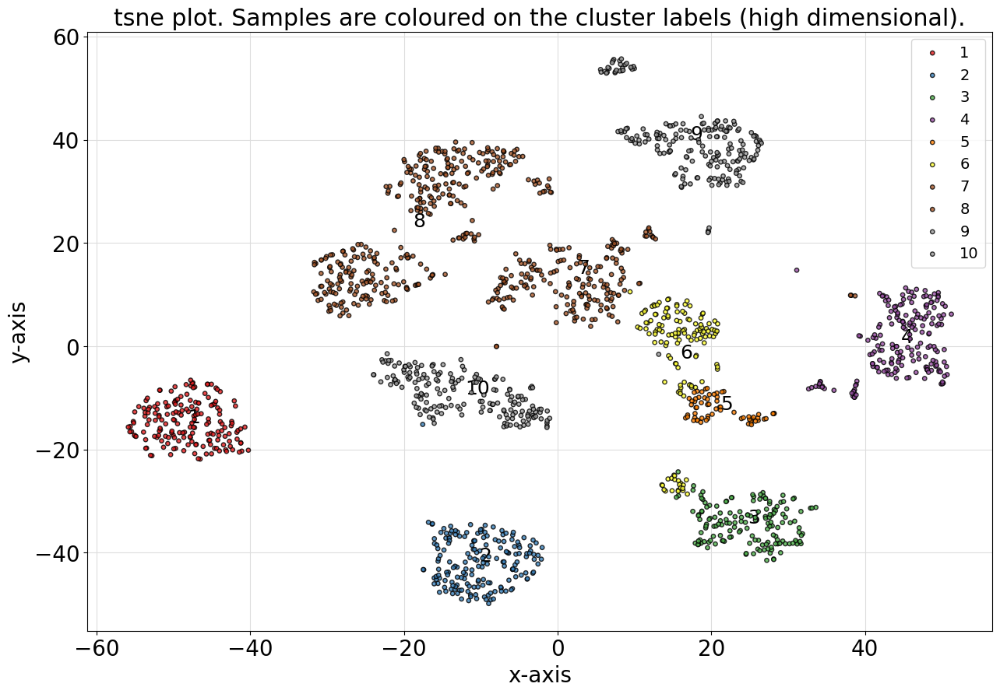

<Figure size 640x480 with 0 Axes>

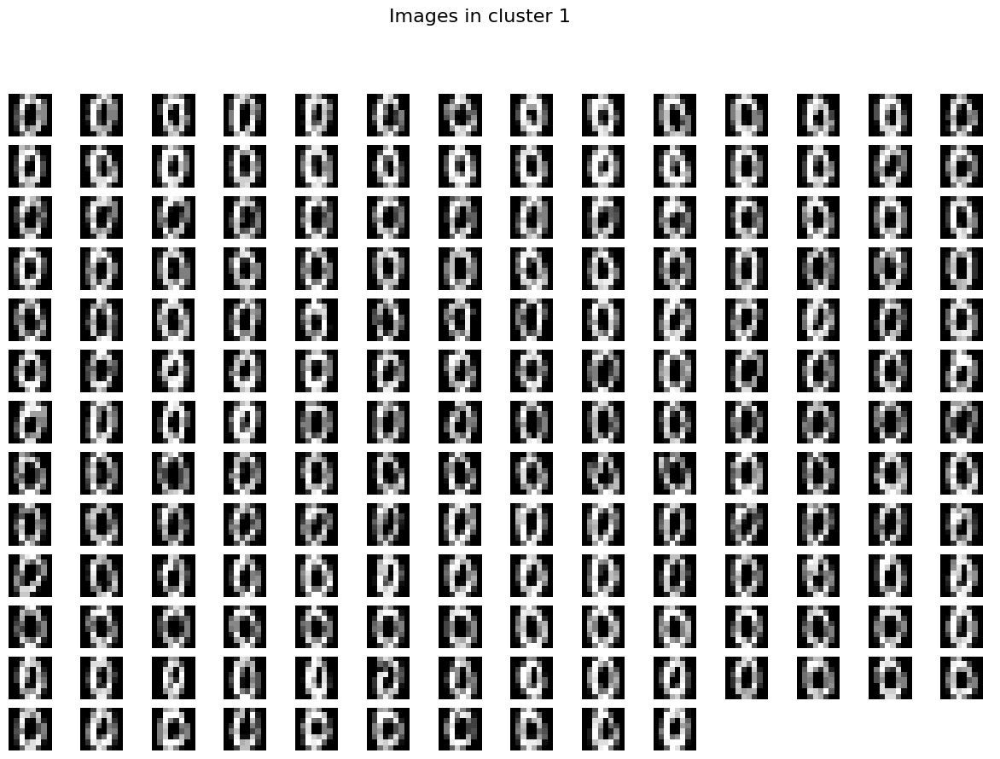

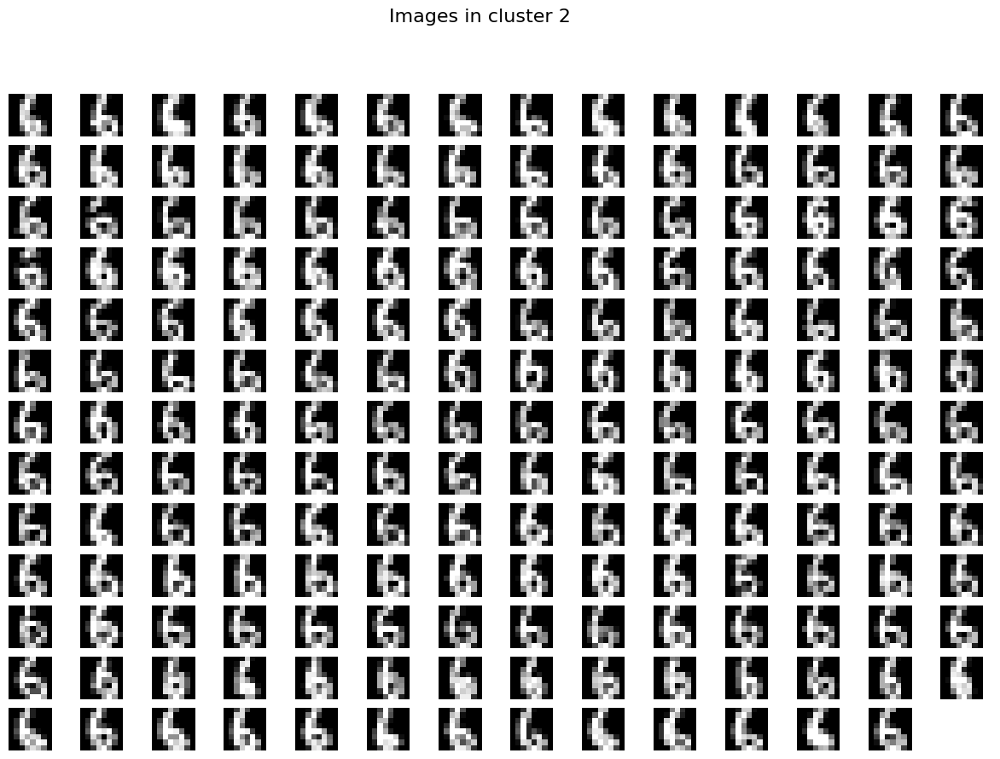

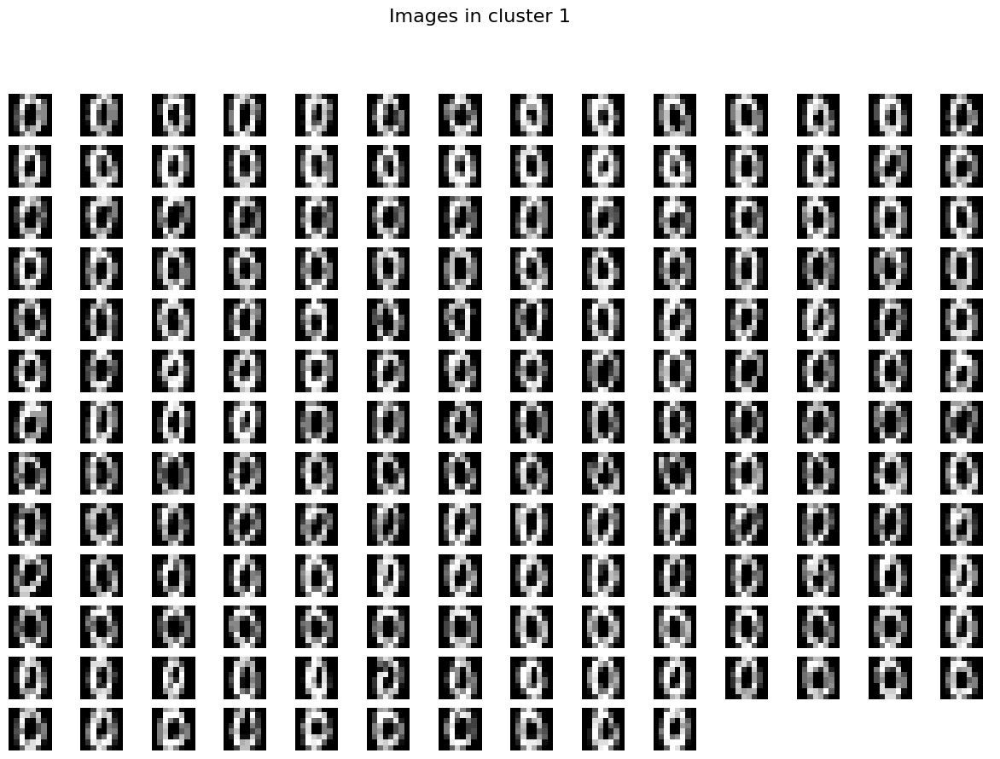

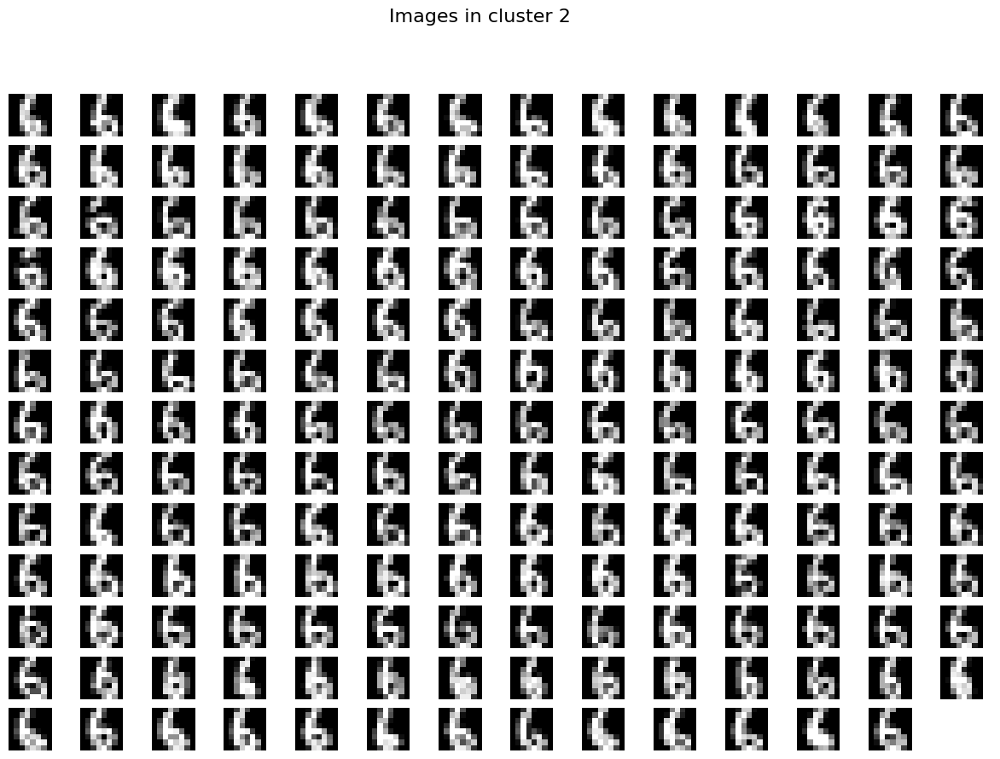

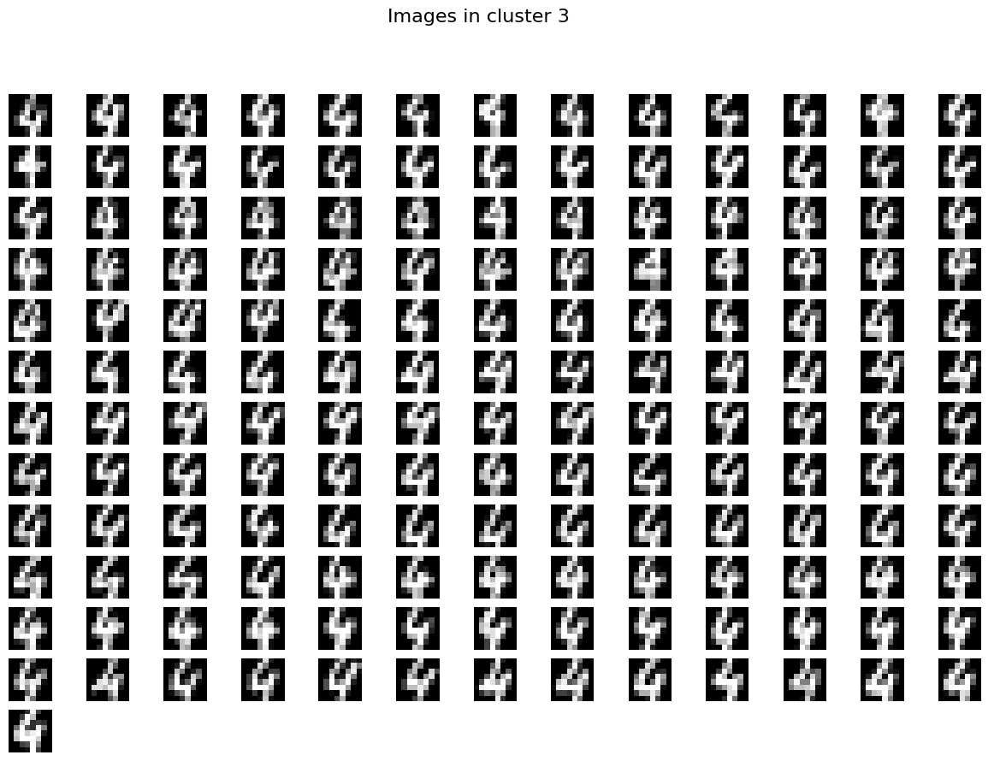

...

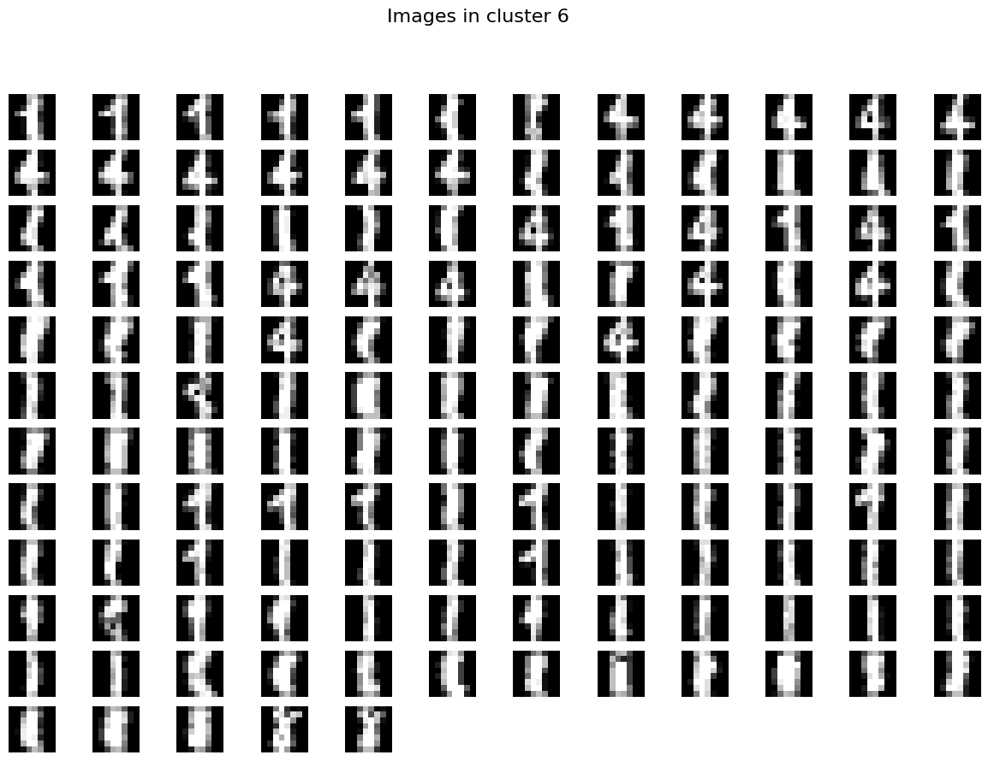

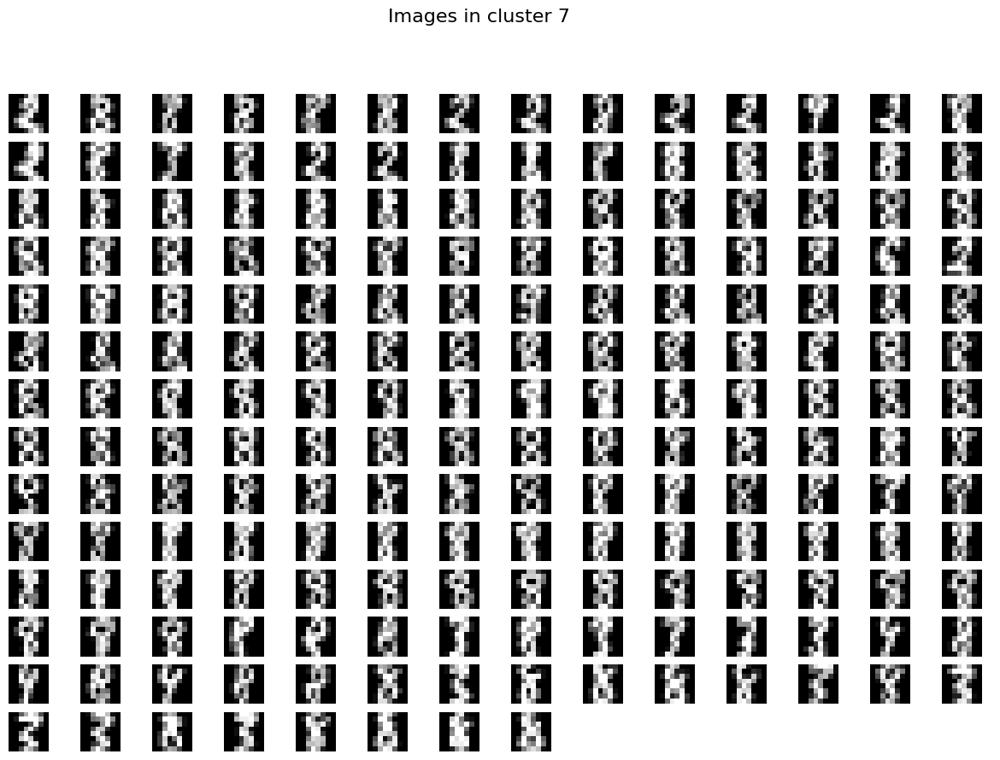

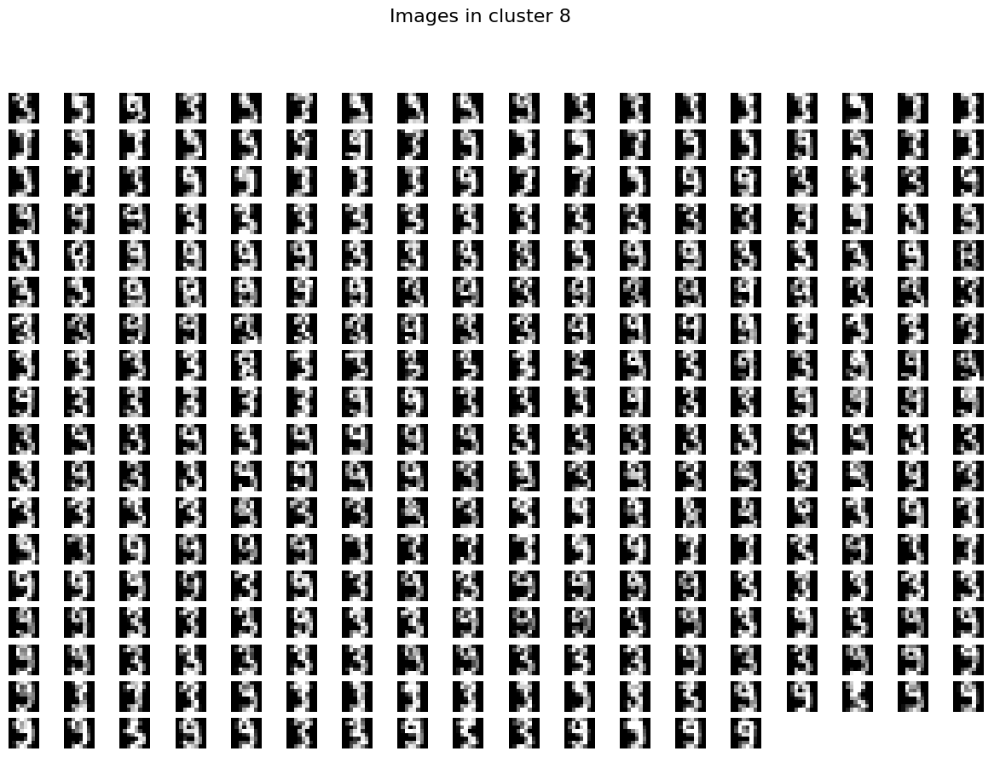

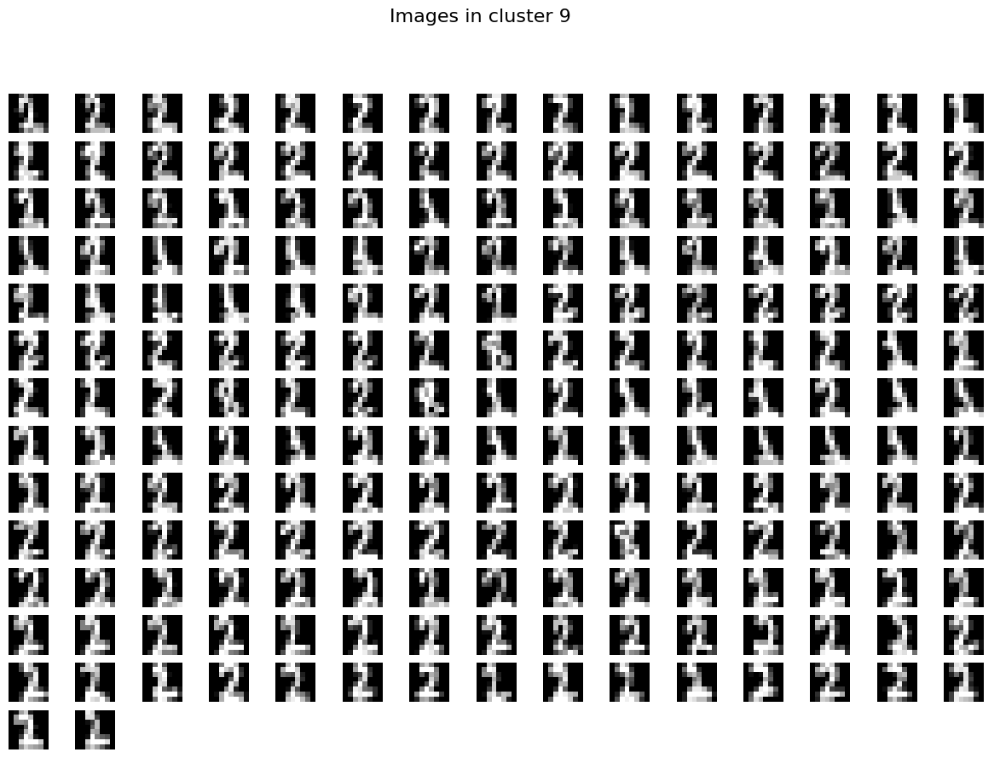

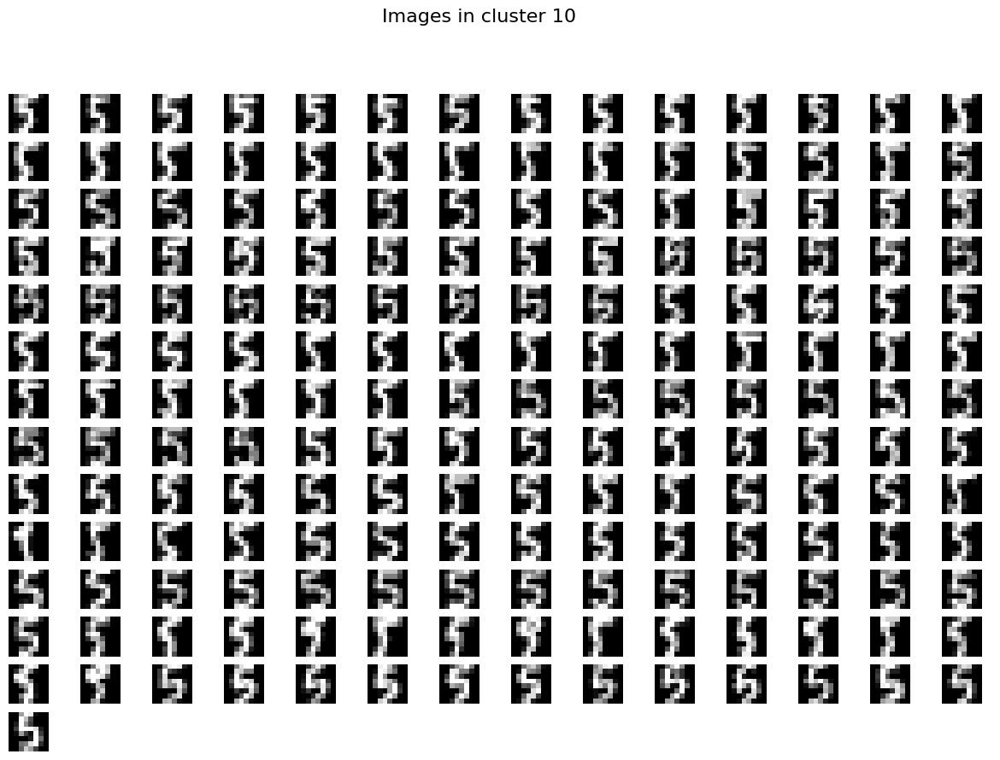

In [20]:
# Silhouette plots
cl.clusteval.plot()
cl.clusteval.scatter(cl.results['xycoord'])

# PCA explained variance plot
cl.pca.plot()

# Dendrogram
cl.dendrogram()

# Plot unique image per cluster
cl.plot_unique(img_mean=False)

# Scatterplot
cl.scatter(zoom=3, img_mean=False)
cl.scatter(zoom=None, img_mean=False)

# Plot images per cluster or all clusters
cl.plot(cmap='binary', labels=[1,2])
cl.plot(cmap='binary')

[clustimage] >WARNING> Parameter grayscale is set to True because you are using method="hog"
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> Import dataset [mnist]
[clustimage] >INFO> Cleaning previous fitted model results
[clustimage] >INFO> Reading and checking images.
[clustimage] >INFO> Scaling images..
[clustimage] >INFO> Writing images to tempdir [/tmp/clustimage]
[clustimage]: 100%|██████████| 1797/1797 [00:00<00:00, 14348.41it/s]
[clustimage] >INFO> Extracting features using method: [hog]
[clustimage]: 100%|██████████| 1797/1797 [00:04<00:00, 421.34it/s]
[clustimage] >INFO> Extracted features using [hog]: samples=1797, features=64
[clustimage] >INFO> Compute [tsne] embedding
[clustimage] >INFO> Cluster evaluation using the [high] feature space of the [hog] features.
[clustimage] >INFO> Saving data in memory.
[clustimage] >INFO> Fit with 

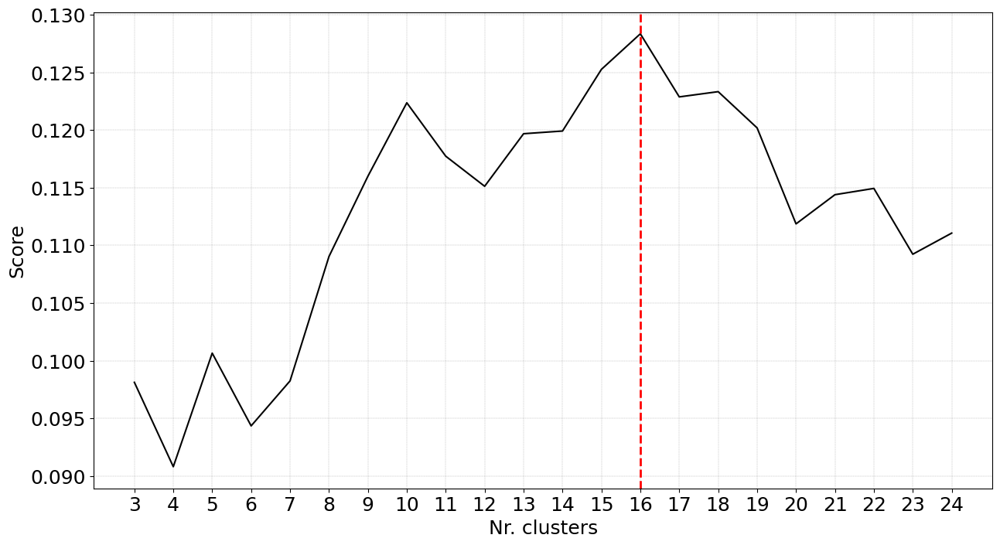

[clustimage] >INFO> Add transparency to RGB colors (last column)
[clustimage] >INFO> Add transparency to RGB colors (last column)
[clustimage] >INFO> Create scatterplot


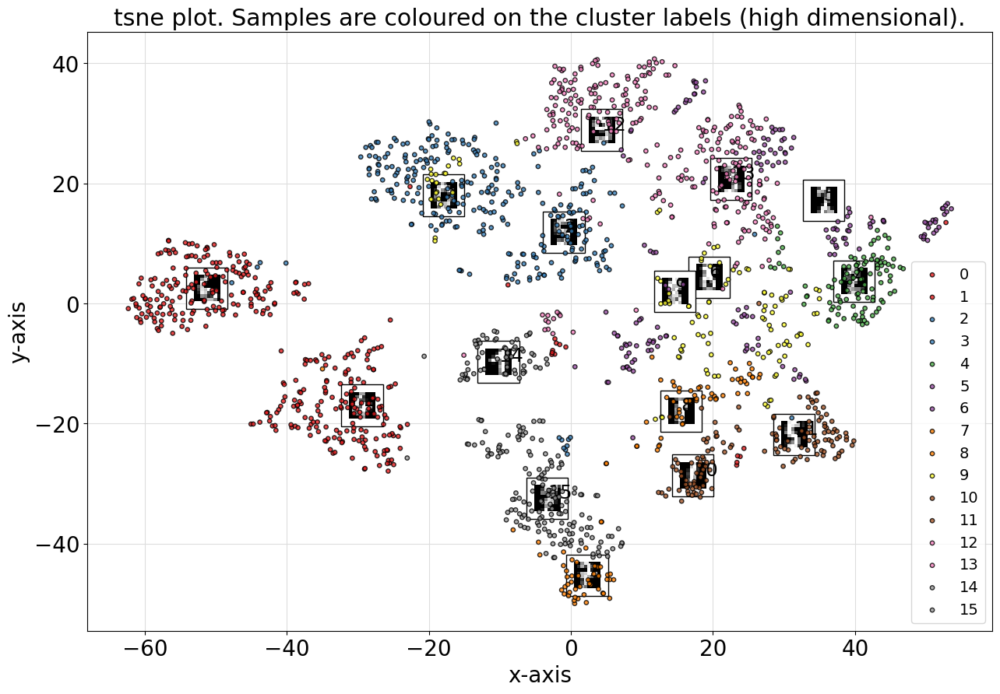

(<Figure size 1500x1000 with 1 Axes>,
 <Axes: title={'center': 'tsne plot. Samples are coloured on the cluster labels (high dimensional).'}, xlabel='x-axis', ylabel='y-axis'>)

<Figure size 640x480 with 0 Axes>

In [22]:
# Import library
from clustimage import Clustimage

# init with HOG method
cl = Clustimage(method='hog', params_hog={'pixels_per_cell':(2,2)})

# Load MNIST example data
X,y = cl.import_example(data='mnist')

# Preprocessing, feature extraction, embedding and cluster evaluation
results = cl.fit_transform(X)

# Plot
cl.clusteval.plot()
cl.scatter(zoom=3, img_mean=False)

In [40]:
import tarfile

# Specify the path to your tar.gz file
file_path = '101_ObjectCategories.tar.gz'

# Open the tar.gz file
with tarfile.open(file_path, 'r:gz') as file:
    file.extractall()  # Extract all contents to the current directory


[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> Cleaning previous fitted model results
[clustimage] >INFO> Extracting images from: [.//101_ObjectCategories//]
[clustimage] >INFO> [9144] files are collected recursively from path: [.//101_ObjectCategories//]
[clustimage] >INFO> [9144] images are extracted.
[clustimage] >INFO> Reading and checking images.
[clustimage] >INFO> Reading and checking images.
[clustimage]: 100%|██████████| 9144/9144 [00:12<00:00, 751.35it/s] 
[clustimage] >INFO> Extracting features using method: [pca]
[clustimage] >INFO> Extracted features using [pca]: samples=9144, features=921
[clustimage] >INFO> Compute [tsne] embedding
[clustimage] >INFO> Cluster evaluation using the [high] feature space of the [pca] features.
[clustimage] >INFO> Saving data in memory.
[clustimage] >INFO> Fit with method=[agglomerative], metric=[eucl

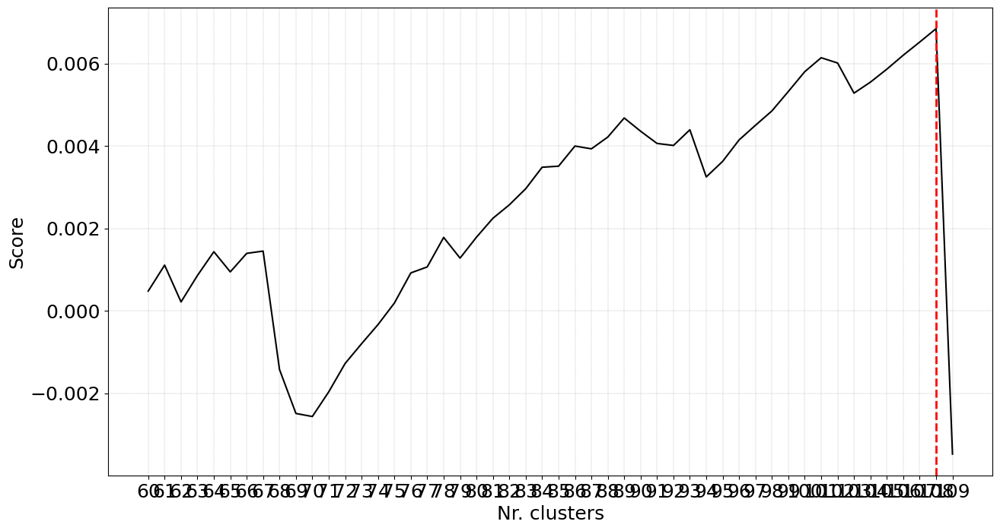

[clustimage] >INFO> Coordinates (x, y) are set based on the first two features.
[clustimage] >INFO> Set alpha based on density because of the parameter: [opaque]
[clustimage] >INFO> Create scatterplot
[clustimage] >INFO> Retrieving input data set.
[clustimage] >INFO> Plotting the dendrogram with optimized settings: metric=euclidean, linkage=ward, max_d=113884.149. Be patient now..
[clustimage] >INFO> Compute cluster labels.
[clustimage] >INFO> Updating cluster-labels 


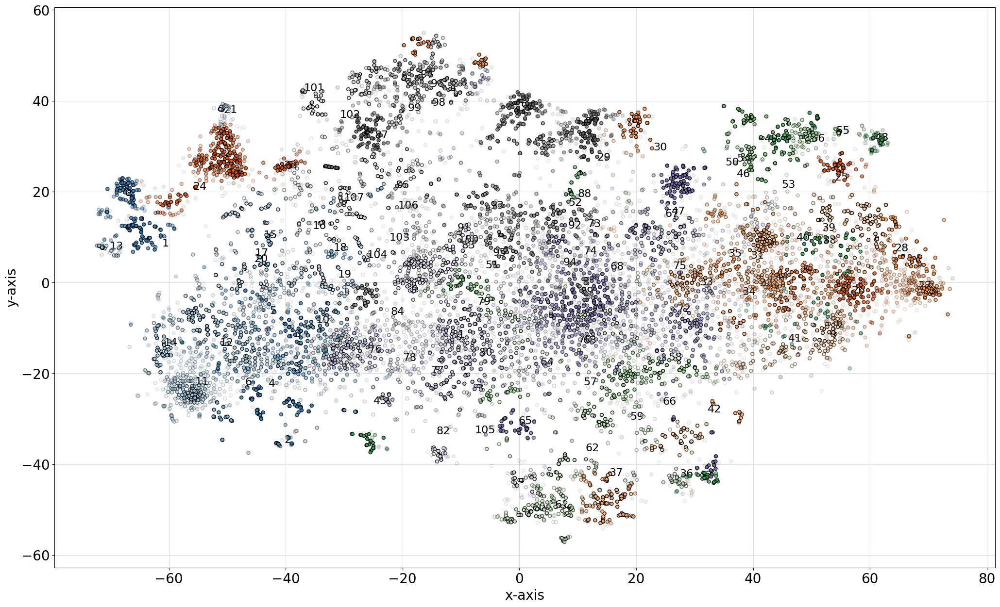

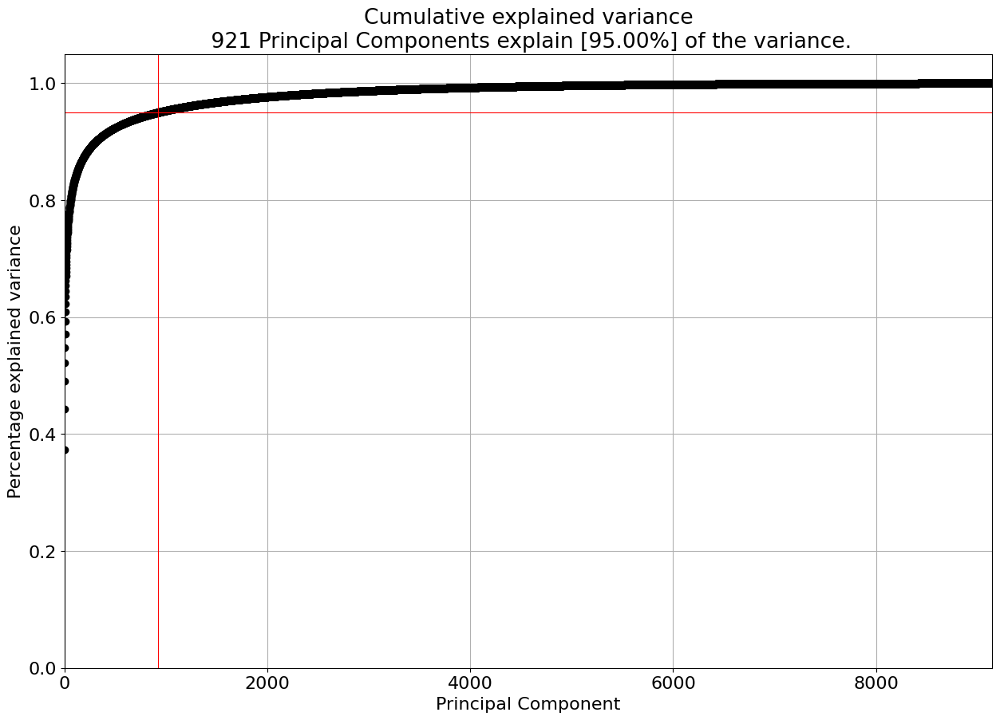

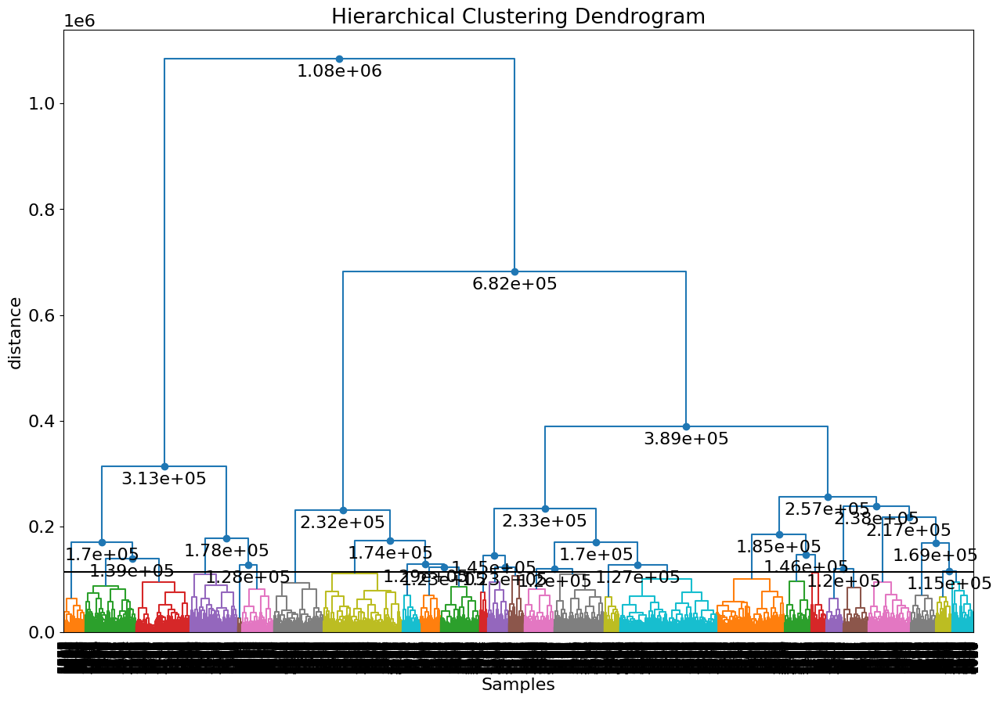

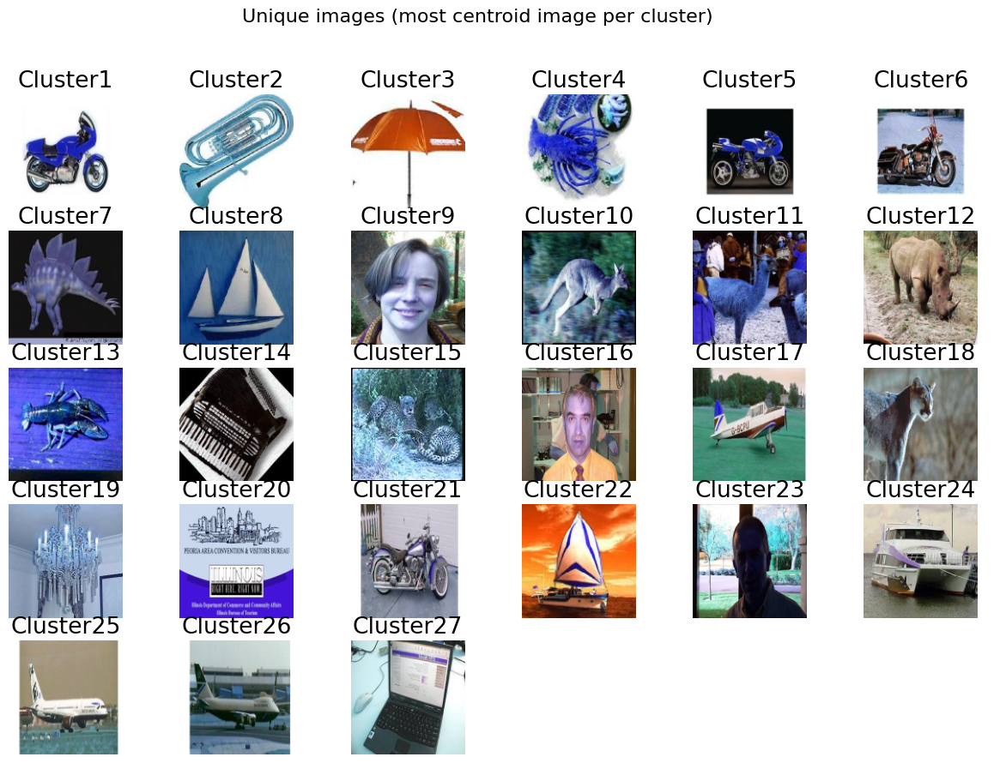

[clustimage] >WARNING> Colormap [Set1] can not create [27] unique colors! Available unique colors: [9].
[clustimage] >WARNING> Colormap [Set1] can not create [27] unique colors! Available unique colors: [9].
[clustimage] >INFO> Add transparency to RGB colors (last column)
[clustimage] >INFO> Add transparency to RGB colors (last column)
[clustimage] >INFO> Create scatterplot


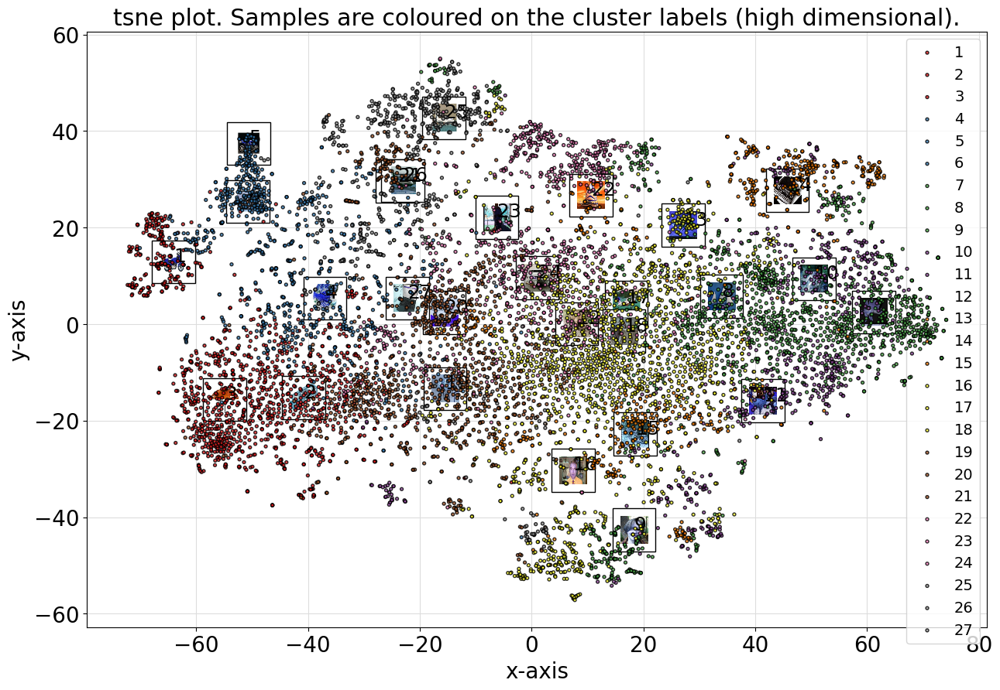

<Figure size 640x480 with 0 Axes>

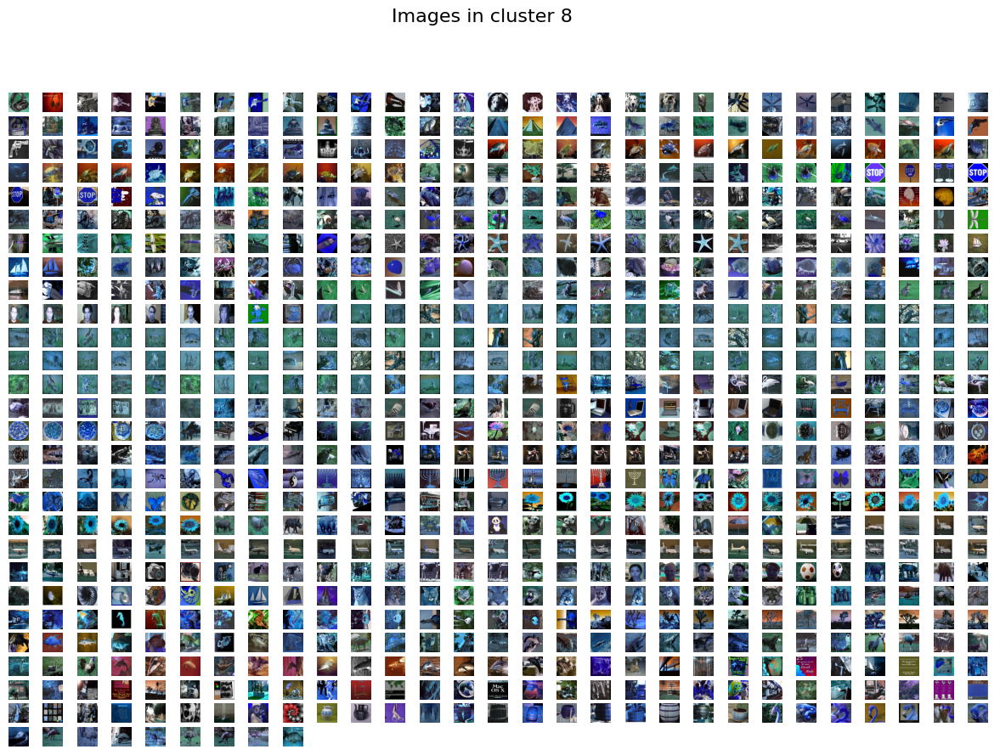

In [41]:
# Import library
from clustimage import Clustimage

# init
cl = Clustimage(method='pca')

# Note that you manually need to download the data from the caltech website and simply provide the directory where the images are stored.
# Download dataset

# Cluster  images in path location.
results = cl.fit_transform('.//101_ObjectCategories//', min_clust=60, max_clust=110)

# If you want to experiment with a different clustering and/or evaluation approach, use the cluster functionality.
# This will avoid pre-processing, and performing the feature extraction of all images again.
# You can also cluster on the 2-D embedded space by setting the cluster_space parameter 'low'
#
# cluster(cluster='agglomerative', evaluate='dbindex', metric='euclidean', linkage='ward', min_clust=15, max_clust=200, cluster_space='high')

# Cluster evaluation plots such as the Silhouette plot
cl.clusteval.plot()
cl.clusteval.scatter(cl.results['xycoord'])

# PCA explained variance plot
cl.pca.plot()

# Dendrogram
cl.dendrogram()

# Plot unique image per cluster
cl.plot_unique(img_mean=False)

# Scatterplot
cl.scatter(dotsize=8, zoom=0.2, img_mean=False)

# Plot images per cluster or all clusters
cl.plot(labels=8)

Flower dataset

[clustimage] >WARNING> Parameter grayscale is set to True because you are using method="hog"
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> Import dataset [flowers]
[clustimage] >INFO> Extracting files..
[clustimage] >INFO> [214] files are collected recursively from path: [/home/lkarimi/myvenv/lib/python3.11/site-packages/datazets/data/flower_images]
[clustimage] >INFO> Cleaning previous fitted model results
[clustimage] >INFO> Reading and checking images.
[clustimage] >INFO> Reading and checking images.
[clustimage]: 100%|██████████| 214/214 [00:00<00:00, 899.22it/s]
[clustimage] >INFO> Extracting features using method: [hog]
[clustimage]: 100%|██████████| 214/214 [00:30<00:00,  7.08it/s]
[clustimage] >INFO> Extracted features using [hog]: samples=214, features=65536
[clustimage] >INFO> Compute [tsne] embedding
[clustimage] >INFO> Cluster eval

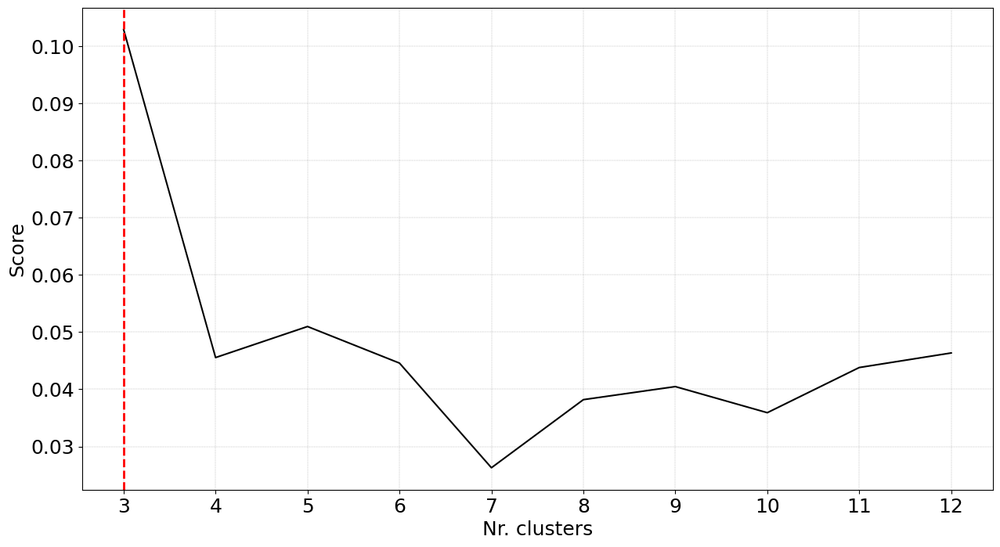

[clustimage] >INFO> Coordinates (x, y) are set based on the first two features.
[clustimage] >INFO> Set alpha based on density because of the parameter: [opaque]
[clustimage] >INFO> Create scatterplot
[clustimage] >INFO> Retrieving input data set.
[clustimage] >INFO> Plotting the dendrogram with optimized settings: metric=euclidean, linkage=ward, max_d=5632.376. Be patient now..
[clustimage] >INFO> Compute cluster labels.
[clustimage] >INFO> Updating cluster-labels 


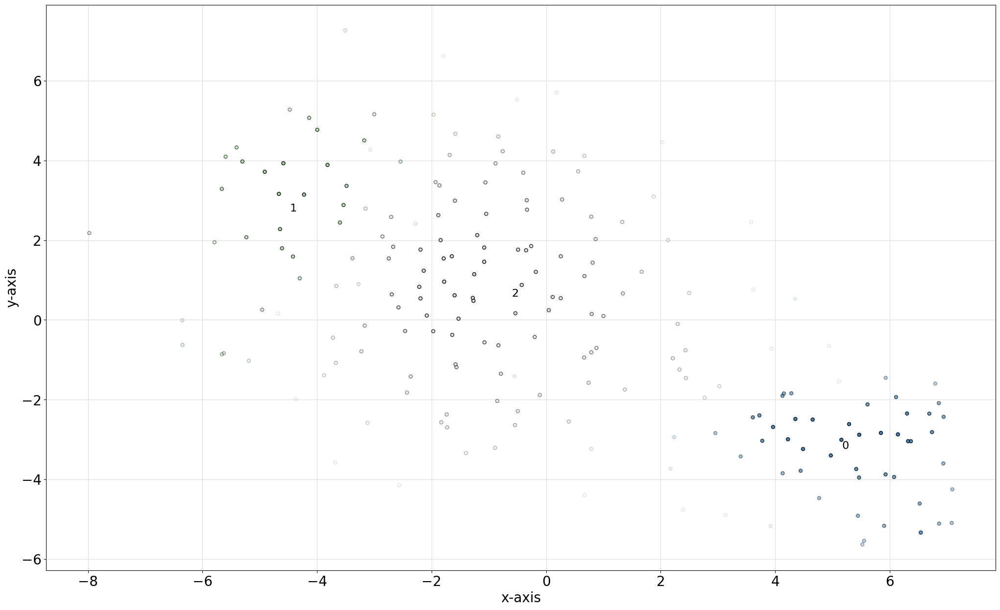

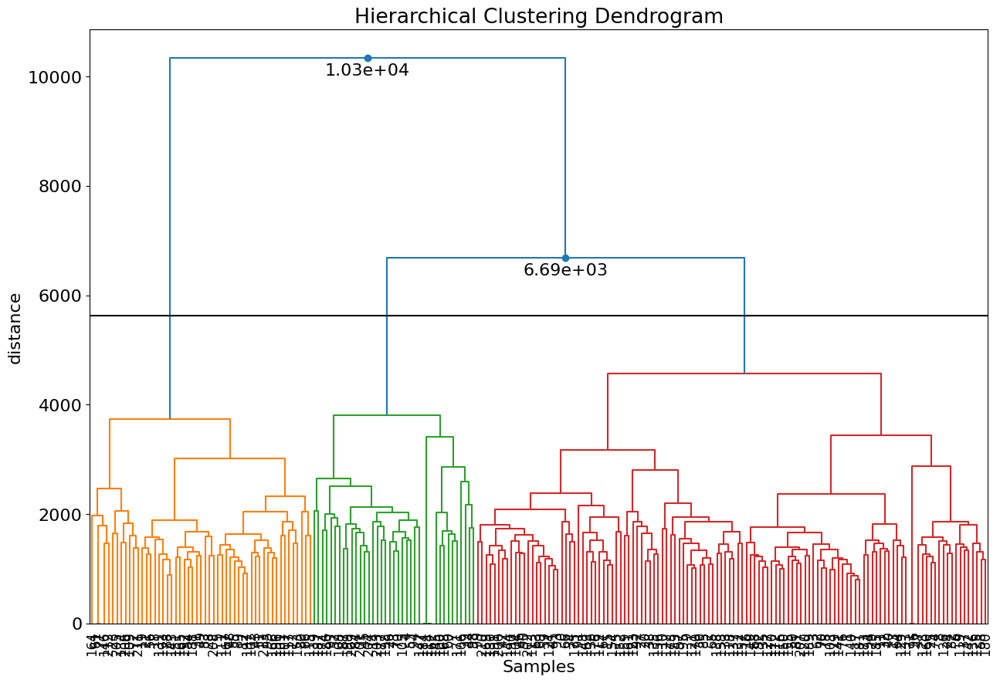

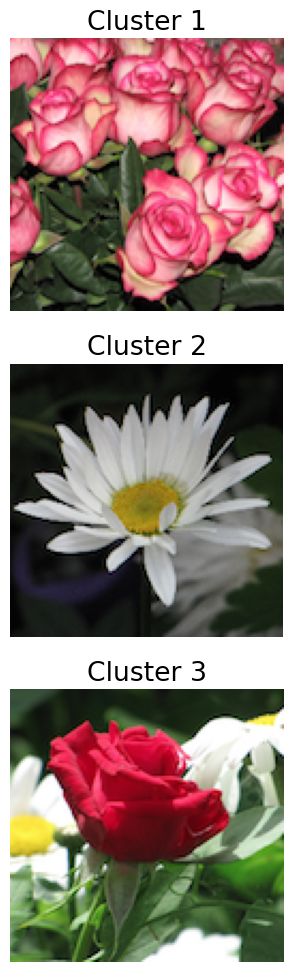

In [53]:
import imageio
import matplotlib.pyplot as plt
from clustimage import Clustimage

# Initialize Clustimage with HOG descriptor
cl = Clustimage(method='hog', params_hog={'orientations':8, 'pixels_per_cell':(8,8)})

# Load example dataset with flowers
pathnames = cl.import_example(data='flowers')

# Cluster images using the provided pathnames.
results = cl.fit_transform(pathnames, min_clust=3, max_clust=13)

# Silhouette plots
cl.clusteval.plot()
cl.clusteval.scatter(cl.results['xycoord'])

# Plot dendrogram
cl.dendrogram()

# Function to plot clustered images
def plot_clustered_images(clustimage, figsize=(10, 10)):
    unique_labels = np.unique(clustimage.results['labels'])
    fig, axs = plt.subplots(nrows=len(unique_labels), figsize=figsize)
    for ax, label in zip(axs, unique_labels):
        indices = np.where(clustimage.results['labels'] == label)[0]
        if indices.size > 0:
            img = imageio.imread(pathnames[indices[0]])  # Display the first image of each cluster
            ax.imshow(img, cmap='gray')
            ax.set_title(f'Cluster {label}')
            ax.axis('off')
    plt.tight_layout()
    plt.show()

# Call the function to plot images from each cluster
plot_clustered_images(cl)


Clustering faces

[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> Import dataset [faces]
[clustimage] >INFO> Cleaning previous fitted model results
[clustimage] >INFO> Reading and checking images.
[clustimage] >INFO> Scaling images..
[clustimage] >INFO> Writing images to tempdir [/tmp/clustimage]
[clustimage]: 100%|██████████| 400/400 [00:00<00:00, 5974.69it/s]
[clustimage] >INFO> Extracting features using method: [pca]
[clustimage] >INFO> Extracted features using [pca]: samples=400, features=127
[clustimage] >INFO> Compute [tsne] embedding
[clustimage] >INFO> Cluster evaluation using the [high] feature space of the [pca] features.
[clustimage] >INFO> Saving data in memory.
[clustimage] >INFO> Fit with method=[agglomerative], metric=[euclidean], linkage=[ward]
[clustimage] >INFO> Evaluate using silhouette.
[clusteval] >INFO: 100%|██████████| 16/16 [00:00<00:00, 2

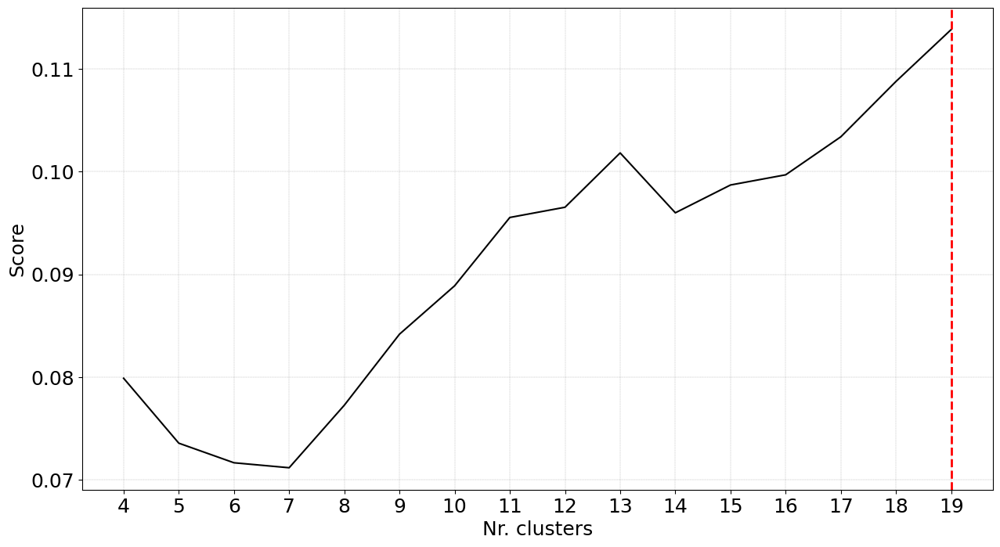

[clustimage] >INFO> Coordinates (x, y) are set based on the first two features.
[clustimage] >INFO> Set alpha based on density because of the parameter: [opaque]
[clustimage] >INFO> Create scatterplot
[clustimage] >INFO> Retrieving input data set.
[clustimage] >INFO> Plotting the dendrogram with optimized settings: metric=euclidean, linkage=ward, max_d=7570.484. Be patient now..
[clustimage] >INFO> Compute cluster labels.
[clustimage] >INFO> Updating cluster-labels 


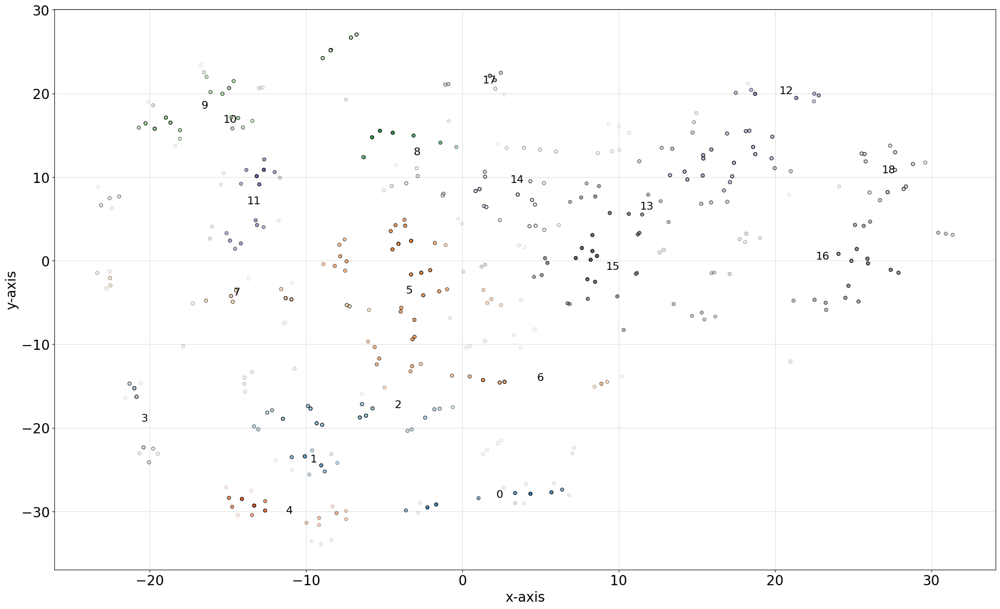

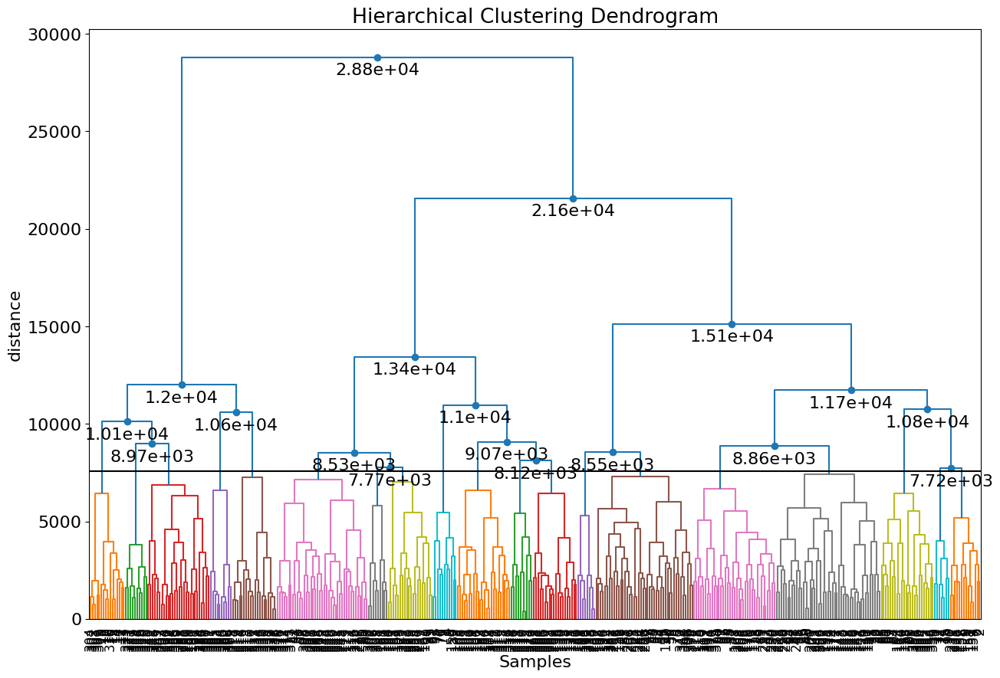

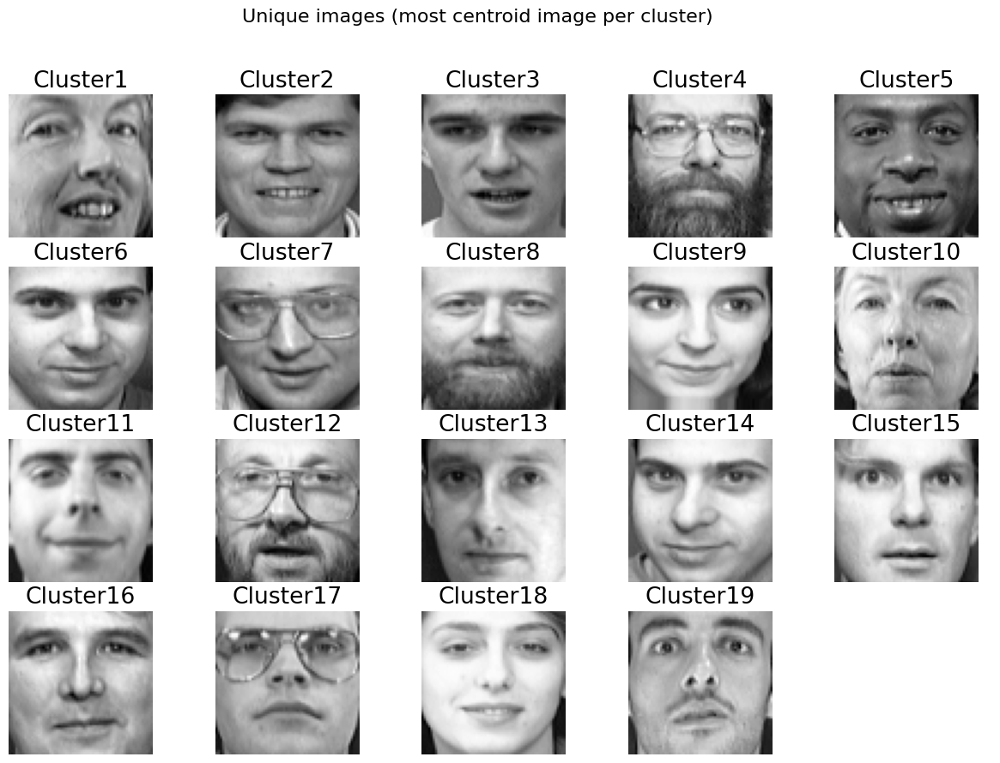

[clustimage] >WARNING> Colormap [Set1] can not create [19] unique colors! Available unique colors: [9].
[clustimage] >WARNING> Colormap [Set1] can not create [19] unique colors! Available unique colors: [9].
[clustimage] >INFO> Add transparency to RGB colors (last column)
[clustimage] >INFO> Add transparency to RGB colors (last column)
[clustimage] >INFO> Create scatterplot


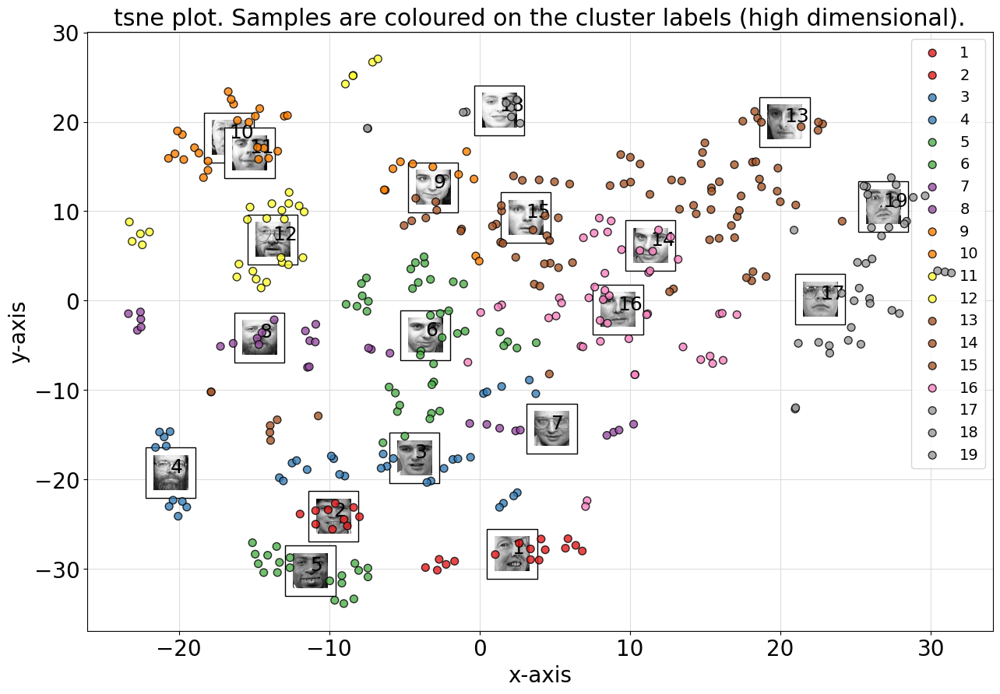

<Figure size 640x480 with 0 Axes>

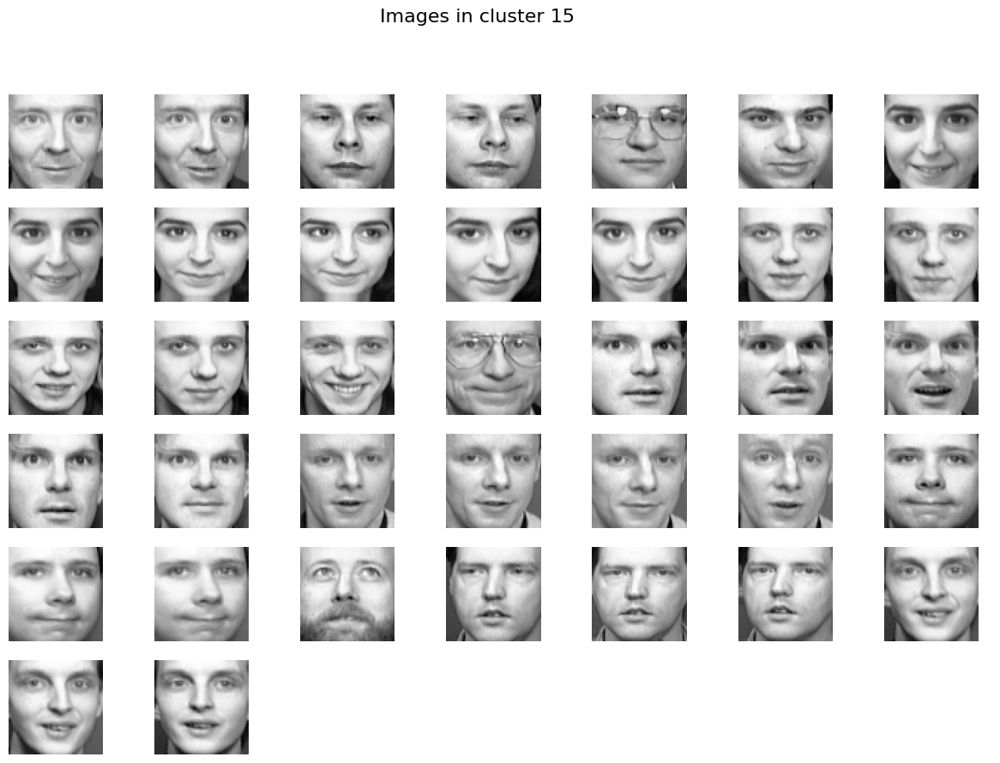

In [55]:
# Import library
from clustimage import Clustimage

# init
cl = Clustimage(method='pca', grayscale=False, dim=(64,64))

# Load example with faces
X ,y = cl.import_example(data='faces')

# Preproceesing, cluster detection
results = cl.fit_transform(X, min_clust=4, max_clust=20)

# Make various plots:

# Silhouette plots
cl.clusteval.plot()
cl.clusteval.scatter(cl.results['xycoord'])

# Dendrogram
cl.dendrogram()

# Plot unique image per cluster
cl.plot_unique(img_mean=False)

# Scatterplot
cl.scatter(dotsize=50, zoom=0.5, img_mean=False)

# Plot images per cluster or all clusters
cl.plot(labels=15)

Find similar images.

[clustimage] >INFO> Import dataset [flowers]
[clustimage] >INFO> Extracting files..
[clustimage] >INFO> [214] files are collected recursively from path: [/home/lkarimi/myvenv/lib/python3.11/site-packages/datazets/data/flower_images]
[clustimage] >INFO> Cleaning previous fitted model results
[clustimage] >INFO> Reading and checking images.
[clustimage] >INFO> Reading and checking images.
[clustimage]: 100%|██████████| 214/214 [00:00<00:00, 899.94it/s]
[clustimage] >INFO> Extracting features using method: [hog]
[clustimage]: 100%|██████████| 214/214 [00:29<00:00,  7.24it/s]
[clustimage] >INFO> Extracted features using [hog]: samples=214, features=65536
[clustimage] >INFO> Compute [tsne] embedding
[clustimage] >INFO> Cluster evaluation using the [high] feature space of the [hog] features.
[clustimage] >INFO> Saving data in memory.
[clustimage] >INFO> Fit with method=[agglomerative], metric=[euclidean], linkage=[ward]
[clustimage] >INFO> Evaluate using silhouette.
[clusteval] >INFO: 100%|█

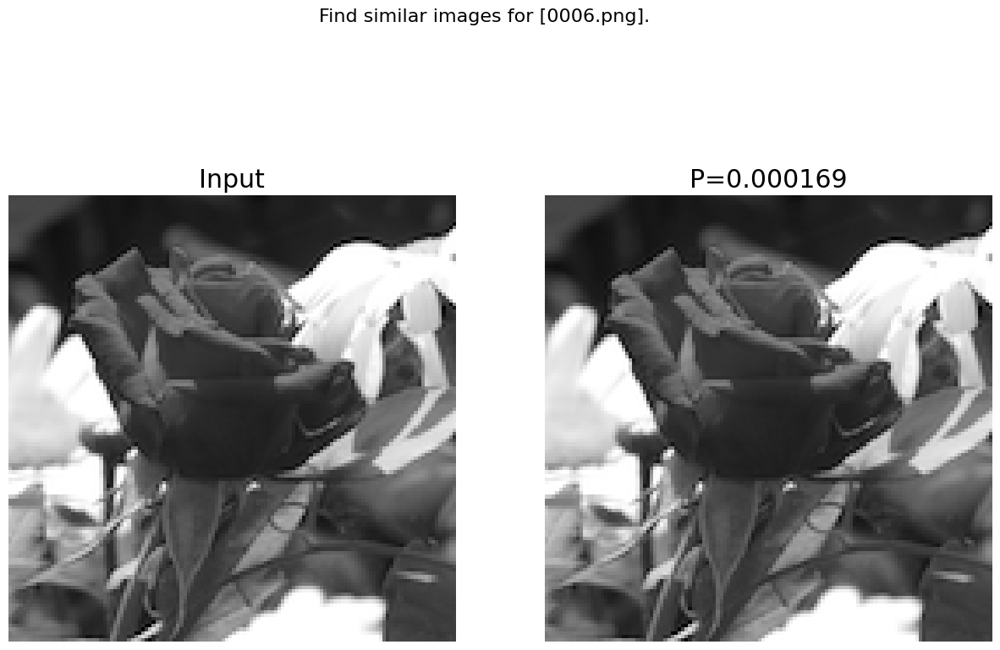

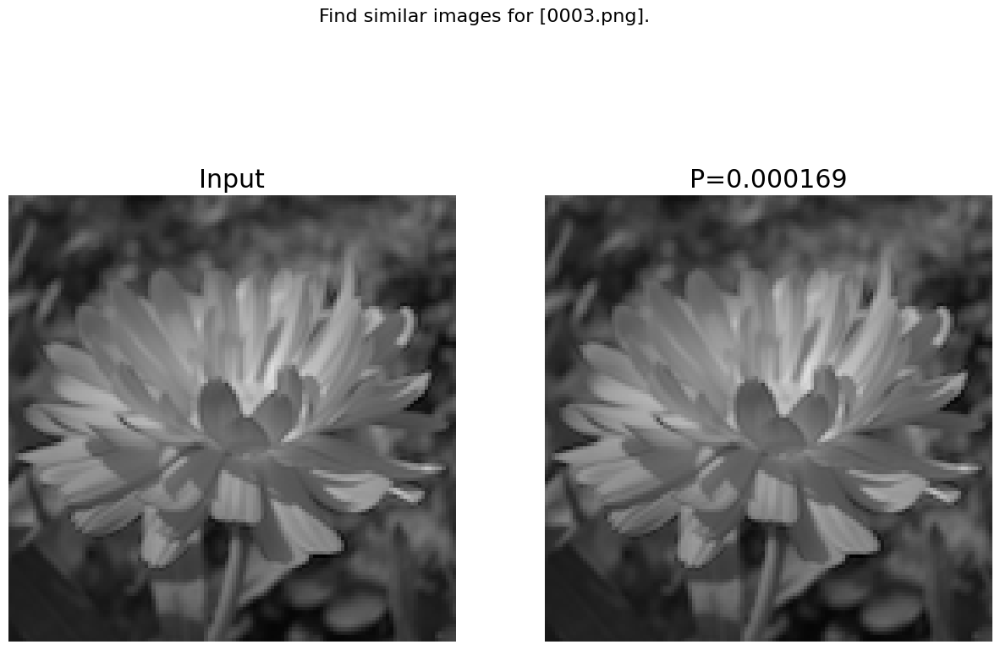

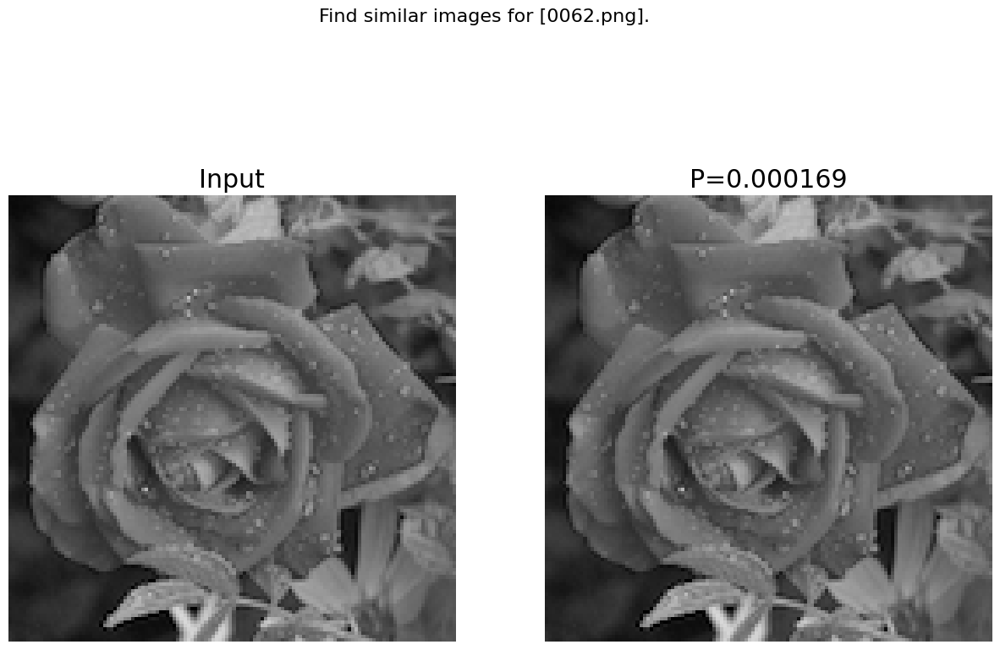

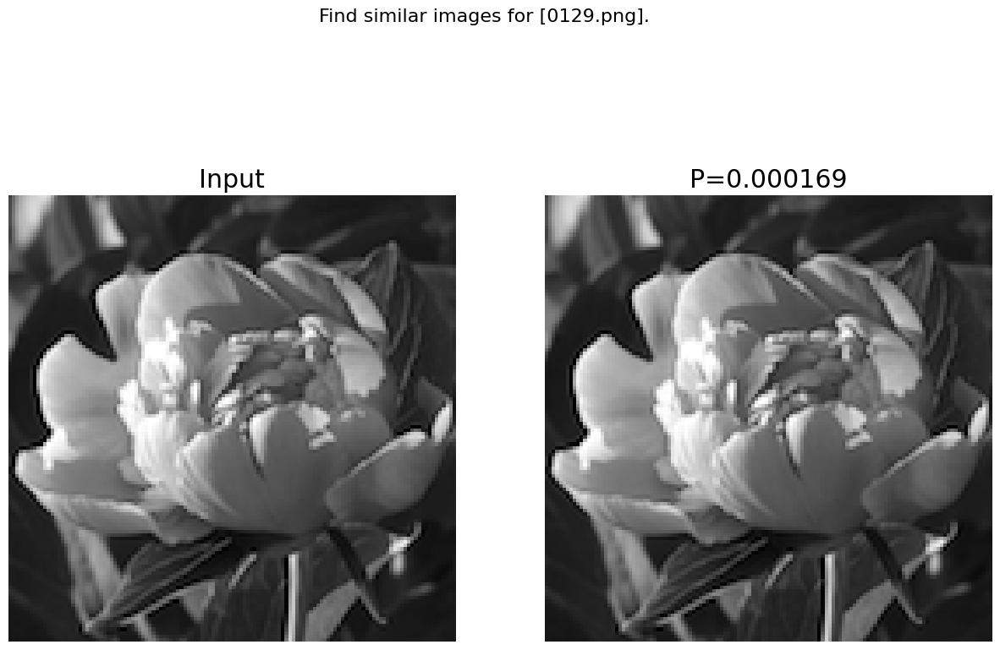

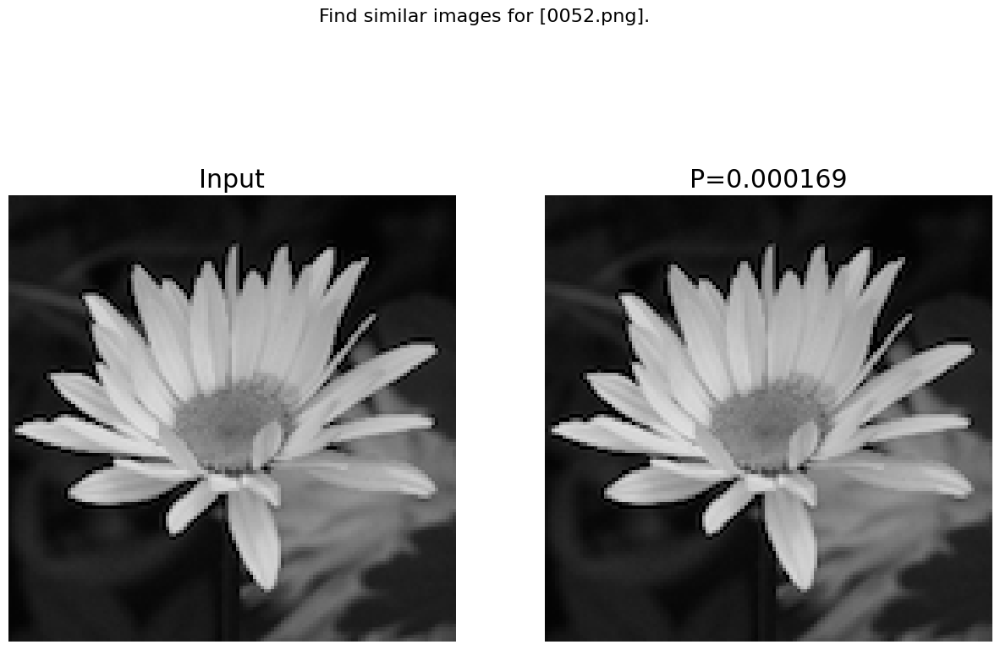

...

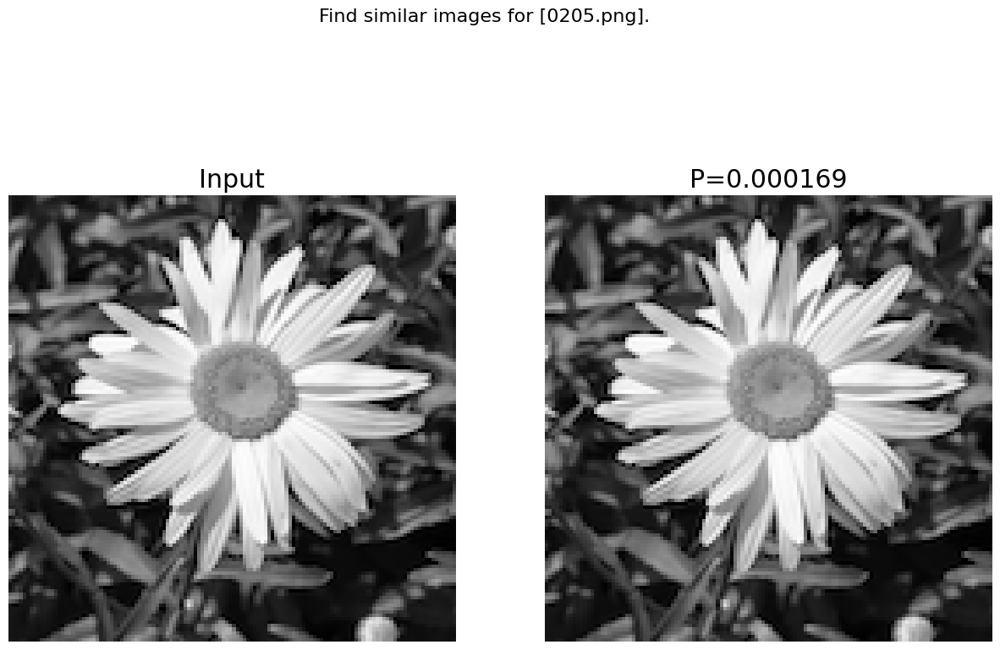

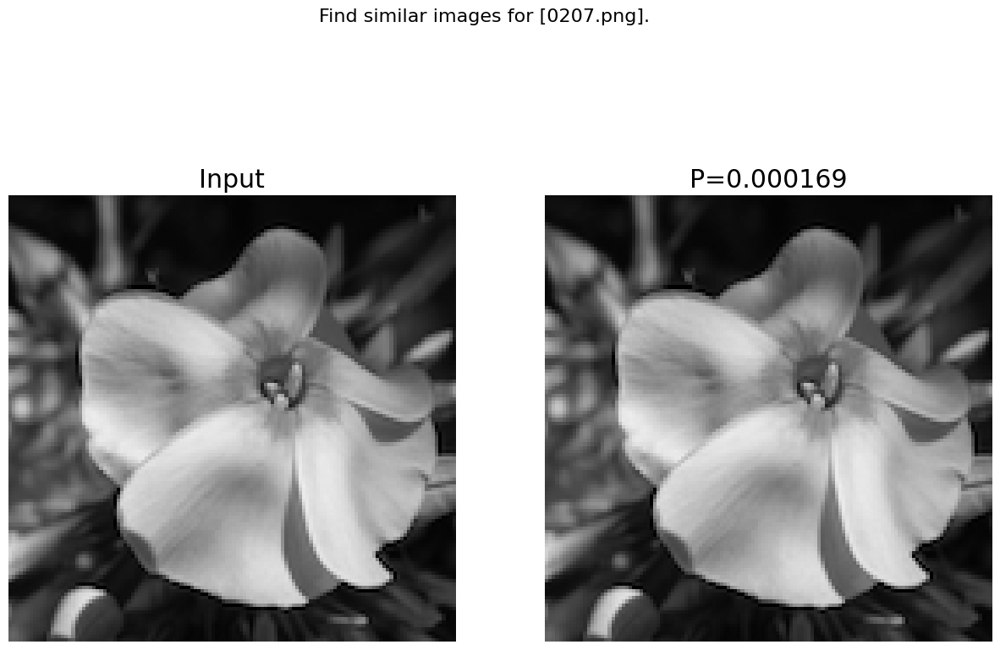

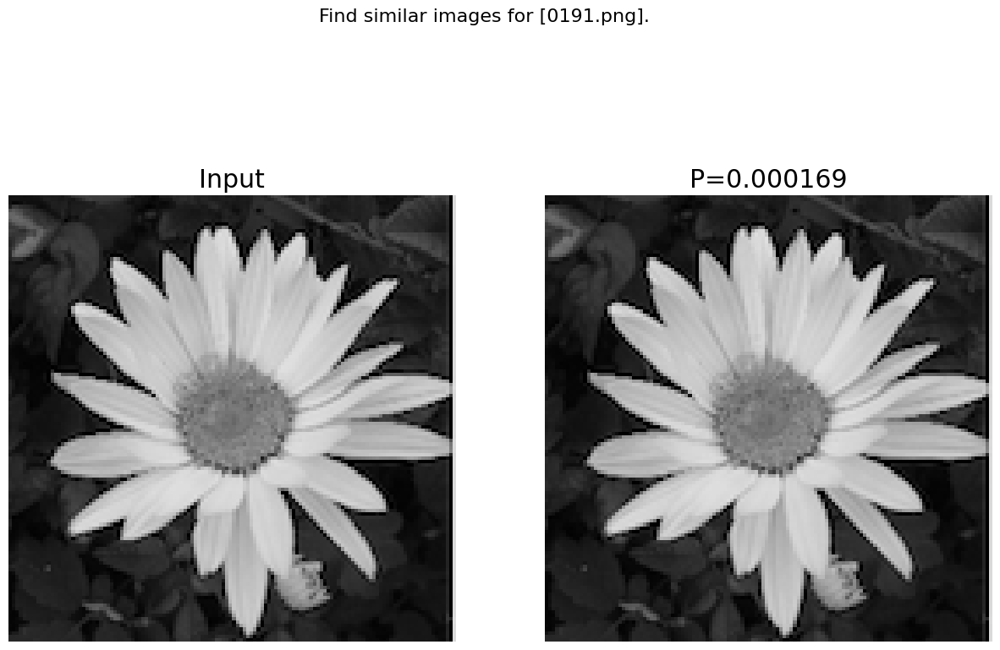

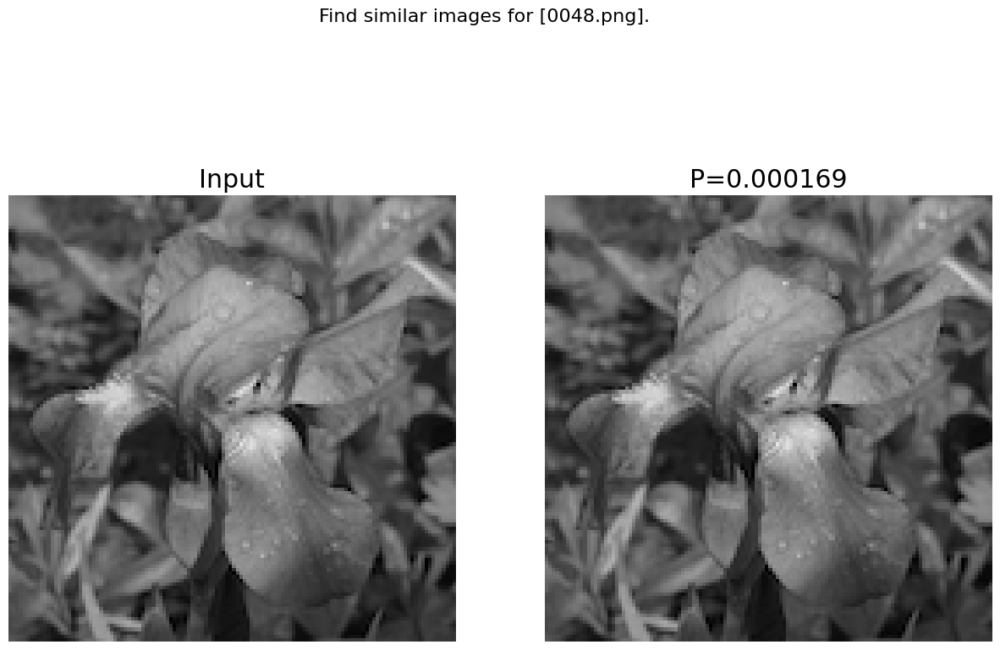

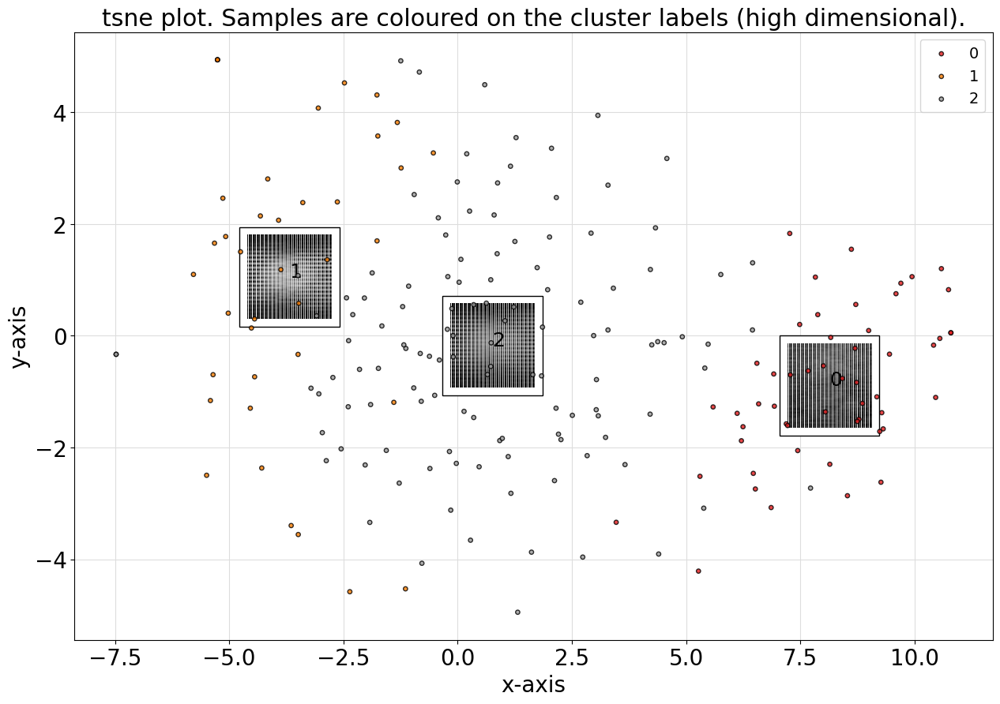

(<Figure size 1500x1000 with 1 Axes>,
 <Axes: title={'center': 'tsne plot. Samples are coloured on the cluster labels (high dimensional).'}, xlabel='x-axis', ylabel='y-axis'>)

<Figure size 640x480 with 0 Axes>

In [58]:
# Import library
from clustimage import Clustimage

# Init with settings such as PCA
cl = Clustimage(method='hog')

# load example with flowers
pathnames = cl.import_example(data='flowers')

# Cluster flowers
results = cl.fit_transform(pathnames)

# Read the unseen image. Note that the find functionality also performs exactly the same preprocessing steps as for the clustering.
results_find = cl.find(pathnames[0:2], k=0, alpha=0.05)

# Show whatever is found. This looks pretty good.
cl.plot_find()
cl.scatter()
